# **Proyek Analisis Data: E-Commerce Public Dataset**
- **Nama:** Yohanes De Britto Dewo Prasetyo
- **Email:** yohanesdewo37@gmail.com
- **ID Dicoding:** yohanesdewo

## **Menentukan Pertanyaan Bisnis**

- **Pertanyaan 1:** Bagaimana segmentasi pelanggan yang berbelanja di e-commerce ini?
- **Pertanyaan 2:** Bagaimana tren penjualan setiap produk yang dipasarkan di e-commerce ini?
- **Pertanyaan 3:** Bagaimana performa penjual/seller yang berada di e-commerce ini?
- **Pertanyaan 4:** Bagaimana distribusi pengiriman pesanan yang terjual dari e-commerce ini?

## **Import Semua Packages/Library yang Digunakan**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

## **Data Wrangling**

### **Gathering Data**

In [2]:
df_item = pd.read_csv("datasets\order_items_dataset.csv")
df_reviews = pd.read_csv("datasets\order_reviews_dataset.csv")
df_orders = pd.read_csv("datasets\orders_dataset.csv")
df_products = pd.read_csv("datasets\products_dataset.csv")
df_geolocation = pd.read_csv("datasets\geolocation_dataset.csv")
df_sellers = pd.read_csv("datasets\sellers_dataset.csv")
df_payments = pd.read_csv("datasets\order_payments_dataset.csv")
df_customers = pd.read_csv("datasets\customers_dataset.csv")
df_category = pd.read_csv("datasets\product_category_name_translation.csv")

#### Memanggil `df_item`

In [3]:
df_item

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


`df_item` berisikan variabel yang berkaitan dengan item-item yang dipesan oleh customer

#### Memanggil `df_reviews`

In [4]:
df_reviews

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


`df_reviews` berisikan variabel yang berkaitan dengan ulasan atau pendapat customer mengenai performa penjualan e-commerce tersebut

#### Memanggil `df_orders`

In [5]:
df_orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


`df_orders` berisikan variabel yang berkaitan dengan status pesanan yang dilakukan oleh customer

#### Memanggil `df_products`

In [6]:
df_products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


`df_products` berisikan keterangan produk yang dijual di e-commerce tersebut

#### Memanggil `df_geolocation`

In [7]:
df_geolocation

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


`df_geolocation` berisikan keterangan lokasi di wilayah Brazil

#### Memanggil `df_sellers`

In [8]:
df_sellers

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


`df_sellers` berisikan keterangan penjual di e-commerce

#### Memanggil `df_payments`

In [9]:
df_payments

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


`df_payments` berisikan informasi mengenai metode pembayaran yang dilakukan customer

#### Memanggil `df_customers`

In [10]:
df_customers

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


`df_customers` berisikan informasi mengenai customer

#### Memanggil `df_category`

In [11]:
df_category

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


`df_category` berisikan keterangan produk yang terjual, namun menggunakan bahasa inggris

**Insight:**\
Telah terkumpul sejumlah dataset yang akan digunakan dalam analisis untuk menjawab pertanyaan-pertanyaan bisnis di atas. Dataset tersebut yaitu:
- `df_item` menjelaskan
- xxx

### **Assessing Data**

#### Menilai tabel `df_item`

In [12]:
df_item['shipping_limit_date'] = pd.to_datetime(df_item['shipping_limit_date'])
df_item.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


In [13]:
df_item.isna().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [14]:
print("Jumlah duplikasi df_item: ", df_item.duplicated().sum())

Jumlah duplikasi df_item:  0


In [15]:
df_item.describe()

,order_item_id,shipping_limit_date,price,freight_value
count,112650.000000,112650,112650.000000,112650.000000
mean,1.197834,2018-01-07 15:36:52.192685312,120.653739,19.990320
min,1.000000,2016-09-19 00:15:34,0.850000,0.000000
25%,1.000000,2017-09-20 20:57:27.500000,39.900000,13.080000
50%,1.000000,2018-01-26 13:59:35,74.990000,16.260000
75%,1.000000,2018-05-10 14:34:00.750000128,134.900000,21.150000
max,21.000000,2020-04-09 22:35:08,6735.000000,409.680000
std,0.705124,NaN,183.633928,15.806405


**Insight:** Dari `df_item`, didapatkan informasi bahwa dataset ini tidak memiliki missing value maupun baris duplikat, sehingga tidak perlu dilakukan data cleaning.

#### Menilai tabel `df_reviews`

In [16]:
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [17]:
df_reviews.isna().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [18]:
print("Jumlah duplikasi df_reviews: ", df_reviews.duplicated().sum())

Jumlah duplikasi df_reviews:  0


In [19]:
df_reviews.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


**Insight:** Dari dataset `df_reviews` tidak ditemukan baris duplikat, namun terdapat missing value di beberapa kolom, sehingga perlu dilakukan data cleaning pada tahap berikutnya.

#### Menilai tabel `df_orders`

In [20]:
df_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [21]:
df_orders.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [22]:
df_orders[df_orders.isna().any(axis=1)]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaN,2018-06-28 00:00:00
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaN,NaN,2018-08-21 00:00:00
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaN,NaN,2017-10-03 00:00:00
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaN,2018-02-07 00:00:00
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaN,NaN,NaN,2018-10-01 00:00:00
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaN,NaN,2018-02-06 00:00:00
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaN,NaN,NaN,2018-09-27 00:00:00
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaN,NaN,2017-09-15 00:00:00


In [23]:
print("Jumlah duplikasi df_orders: ", df_orders.duplicated().sum())

Jumlah duplikasi df_orders:  0


In [24]:
df_orders.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


**Insight:** Dari dataset `df_orders` tidak ditemukan baris duplikat, namun terdapat missing value di beberapa kolom, sehingga perlu dilakukan data cleaning pada tahap berikutnya.

#### Menilai tabel `df_products`

In [25]:
df_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [26]:
df_products.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [27]:
print("Jumlah duplikasi df_products: ", df_products.duplicated().sum())

Jumlah duplikasi df_products:  0


In [28]:
df_products.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


**Insight:** Dari dataset `df_products` tidak ditemukan baris duplikat, namun terdapat missing value di beberapa kolom, sehingga perlu dilakukan data cleaning pada tahap berikutnya.

#### Menilai tabel `df_geolocation`

In [29]:
df_geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [30]:
df_geolocation.isna().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [31]:
print("Jumlah duplikasi df_geolocation: ", df_geolocation.duplicated().sum())

Jumlah duplikasi df_geolocation:  261831


In [32]:
df_geolocation.describe()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


**Insight:** Dari dataset `df_geolocation` tidak ditemukan missing value, namun terdapat duplikasi data di beberapa baris, sehingga perlu dilakukan data cleaning pada tahap berikutnya.

#### Menilai tabel `df_sellers`

In [33]:
df_sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [34]:
df_sellers.isna().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

In [35]:
print("Jumlah duplikasi df_sellers: ", df_sellers.duplicated().sum())

Jumlah duplikasi df_sellers:  0


In [36]:
df_sellers.describe()

,seller_zip_code_prefix
count,3095.000000
mean,32291.059451
std,32713.453830
min,1001.000000
25%,7093.500000
50%,14940.000000
75%,64552.500000
max,99730.000000


**Insight:** Dari dataset `df_sellers` tidak ditemukan missing value maupun baris duplikat, sehingga tidak perlu dilakukan data cleaning.

#### Menilai tabel `df_payments`

In [37]:
df_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [38]:
df_payments.isna().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [39]:
print("Jumlah duplikasi df_payments: ", df_payments.duplicated().sum())

Jumlah duplikasi df_payments:  0


In [40]:
df_payments.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


**Insight:** Dari dataset `df_payments` tidak ditemukan missing value maupun baris duplikat, sehingga tidak perlu dilakukan data cleaning.

#### Menilai tabel `df_customers`

In [41]:
df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [42]:
df_customers.isna().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [43]:
print("Jumlah duplikasi df_customers: ", df_customers.duplicated().sum())

Jumlah duplikasi df_customers:  0


In [44]:
df_customers.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


**Insight:** Dari dataset `df_customers` tidak ditemukan missing value maupun baris duplikat, sehingga tidak perlu dilakukan data cleaning.

#### Menilai tabel `df_category`

In [45]:
df_category.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [46]:
df_category.isna().sum()

product_category_name            0
product_category_name_english    0
dtype: int64

In [47]:
print("Jumlah duplikasi df_category: ", df_category.duplicated().sum())

Jumlah duplikasi df_category:  0


In [48]:
df_category.describe()

,product_category_name,product_category_name_english
count,71,71
unique,71,71
top,beleza_saude,health_beauty
freq,1,1


**Insight:** Dari dataset `df_category` tidak ditemukan missing value maupun baris duplikat, sehingga tidak perlu dilakukan data cleaning. Akan tetapi, dikarenakan dataset ini pada dasarnya hanya berisi terjemahan dari dataset `df_products`, sehingga untuk selanjutnya akan dilakukan merge untuk kedua dataset tersebut untuk memudahkan pengerjaan.

In [49]:
df_products = df_products.merge(df_category, on='product_category_name', how='left')
df_products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares
...,...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0,computers_accessories


### **Cleaning Data**

#### Menghapus kolom tidak perlu
Kolom-kolom berikut sengaja dihapus karena dirasa tidak penting dan tidak akan digunakan pada analisis selanjutnya.

##### `df_item`

In [50]:
df_item_cleaned = df_item.drop(columns=['order_item_id', 'shipping_limit_date', 'freight_value'])
df_item_cleaned

,order_id,product_id,seller_id,price
0,00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90
1,00018f77f2f0320c557190d7a144bdd3,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90
2,000229ec398224ef6ca0657da4fc703e,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00
3,00024acbcdf0a6daa1e931b038114c75,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99
4,00042b26cf59d7ce69dfabb4e55b4fd9,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90
...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,299.99
112646,fffcd46ef2263f404302a634eb57f7eb,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,350.00
112647,fffce4705a9662cd70adb13d4a31832d,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,99.90
112648,fffe18544ffabc95dfada21779c9644f,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,55.99


##### `df_reviews`

In [51]:
df_reviews_cleaned = df_reviews.drop(columns=['review_comment_title','review_comment_message', 'review_creation_date', 'review_answer_timestamp'])
df_reviews_cleaned

,review_id,order_id,review_score
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5
...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4


##### `df_products`

In [52]:
df_products_cleaned = df_products.drop(columns=['product_category_name','product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g',
                                                'product_length_cm', 'product_height_cm', 'product_width_cm'])
df_products_cleaned

,product_id,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,art
2,96bd76ec8810374ed1b65e291975717f,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,baby
4,9dc1a7de274444849c219cff195d0b71,housewares
...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,computers_accessories


#### Mengatasi missing values

##### `df_orders`

In [53]:
df_orders_cleaned = df_orders
df_orders_cleaned

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


Pada dataset ini, terdapat kejanggalan pada beberapa baris yang mengandung missing value, yaitu pada baris yang `order_status` nya berisi `delivered` atau `shipped`, namun `order_approved_at` nya kosong. Hal ini tentu tidak masuk akal. Untuk itu, akan dilakukan imputasi missing value pada baris-baris tersebut, yaitu diisi sama dengan waktu pada `order_purchase_timestamp`.

In [54]:
df_orders_cleaned.loc[df_orders_cleaned['order_status'].isin(['delivered', 'shipped']), 'order_approved_at'] = df_orders_cleaned.loc[df_orders_cleaned['order_status'].isin(['delivered', 'shipped']), 'order_approved_at'].fillna(df_orders_cleaned['order_purchase_timestamp'])
df_orders_cleaned

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


Untuk missing value sisanya sengaja dibiarkan, hal ini dikarenakan pada faktanya memang `order_status` pelanggan akan mempengaruhi catatan waktu di variabel-variabel lainnya. Contoh, semisal `order_status` bertuliskan `processing`, maka tetap ada kemungkinan bahwa orderan tersebut belum diserahkan ke kurir dan belum dikirimkan ke pelanggan, sehingga akan bernilai kosong/missing.

In [55]:
df_orders_cleaned.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 146
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

##### `df_products`

In [56]:
df_products_cleaned.isna().sum()

product_id                         0
product_category_name_english    623
dtype: int64

Ditemukan beberapa nama kategori masih tidak terdefinisi, sehingga dilakukan imputasi missing value dengan menambah kategori baru yaitu `Unknown`

In [57]:
df_products_cleaned['product_category_name_english'] = df_products_cleaned['product_category_name_english'].fillna("Unknown")

In [58]:
df_products_cleaned.isna().sum()

product_id                       0
product_category_name_english    0
dtype: int64

#### Mengatasi duplikasi data

##### `df_geolocation`

Baris terduplikasi pada dataset ini akan dihapus.

In [59]:
df_geolocation.drop_duplicates(inplace=True)
print("Jumlah duplikasi df_geolocation: ", df_geolocation.duplicated().sum())

Jumlah duplikasi df_geolocation:  0


## Exploratory Data Analysis (EDA)

### Explore `df_item`

In [60]:
df_item_cleaned.sample(10)

,order_id,product_id,seller_id,price
44777,65d009e49beeedab2b25830b9e69a6ea,51ff0a0f61611dfa94e43c834c949dd3,33a17d60c64393351ebf1ef860f4e0f2,149.90
74317,a95624561ff5062159952d1631e5b622,42a2c92a0979a949ca4ea89ec5c7b934,813348c996469b40f2e028d5429d3495,59.90
108151,f5c6d2e1e505748547e4ae426b377168,f9259c9e7c0f12c70f7a81409680a5ff,3db66a856d18a9cba7c9241fc5221c50,69.90
90756,ce243573aa83a8e70bb99ca6133a210e,d3796e73f7d260e45f5d5b9dc1c5a7a1,41b39e28db005d9731d9d485a83b4c38,139.90
8287,12d9b7528c95b9b6d2f087195ba47d60,25cdef5b1428725aa16b8b9a6fbd72ca,76d64c4aca3a7baf218bf93ef7fa768d,64.90
107499,f4454801db3daa7590e69cb94356174b,336cfb12a5468070795ae4c964f4ce47,7008613ea464bad5cb9b83456e1e6a8f,96.00
37210,54740211161142390c454785bc1e9fbb,c6ea63369936552872ae890c82175b4b,37be5a7c751166fbc5f8ccba4119e043,205.00
75549,ac0b40db773fed894ef5646453a38544,11875b30b49585209e608f40e8082e65,669ae81880e08f269a64487cfb287169,65.00
55244,7d9c21ba37fb1729afeadf7184a23780,f8b624d4e475bb8d1bddf1b65c6a64f6,b410bdd36d5db7a65dcd42b7ead933b8,179.00
108072,f5967f0a9a614d8ccb6b2c1c16bde5ed,730f1927f42fda4370209c28203eb0ab,1900267e848ceeba8fa32d80c1a5f5a8,13.99


In [61]:
df_item_cleaned.describe()

,price
count,112650.000000
mean,120.653739
std,183.633928
min,0.850000
25%,39.900000
50%,74.990000
75%,134.900000
max,6735.000000


### Explore `df_reviews`

In [62]:
df_reviews_cleaned

,review_id,order_id,review_score
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5
...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4


In [63]:
df_reviews_cleaned['review_score'].value_counts(ascending=False)

review_score
5    57328
4    19142
1    11424
3     8179
2     3151
Name: count, dtype: int64

Akan dilakukan kategorisasi untuk kepuasan pelanggan berdasarkan skor rating yang diberikan

In [64]:
score_bins = [0, 2, 3, 5]
score_labels = ["Tidak Puas", "Netral", "Puas"]
df_reviews_cleaned['review_category'] = pd.cut(df_reviews_cleaned['review_score'], bins=score_bins, labels=score_labels)
df_reviews_cleaned['review_category'].value_counts(ascending=False)

review_category
Puas          76470
Tidak Puas    14575
Netral         8179
Name: count, dtype: int64

### Explore `df_orders`

In [65]:
df_orders_cleaned.sample(10)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6044,214026e389020b815048174316597274,d4028850672d0f7f8158b06d9d381247,delivered,2018-01-15 12:02:56,2018-01-15 15:50:50,2018-01-15 22:58:34,2018-01-19 18:27:53,2018-02-05 00:00:00
70648,fb699452d6799cc45801c305bc0db749,68fee6738238719fc44935a11806101e,delivered,2018-06-24 13:53:51,2018-06-24 17:18:22,2018-06-25 15:08:00,2018-06-26 20:03:58,2018-07-12 00:00:00
957,59a0b1e1b934789d033dfb98797d9d34,2fa6eb7ad02d5495e29bebb6d4774257,delivered,2017-07-20 23:51:43,2017-07-22 02:15:47,2017-07-24 19:05:02,2017-08-02 17:37:22,2017-08-21 00:00:00
73548,13d3f4e508a98d94177dcdb34a8469c3,74df87b2ebcb43ec7e67d677a3a88a8b,delivered,2017-12-22 13:56:34,2017-12-27 04:12:35,2017-12-28 21:29:48,2017-12-29 16:15:55,2018-01-12 00:00:00
76616,5c1d89aac6e3b4a8f69d548ea030179a,ebfec89ff4443951e41c19c07203210e,delivered,2018-02-07 15:30:26,2018-02-07 15:52:20,2018-02-08 20:58:49,2018-02-17 01:38:00,2018-03-02 00:00:00
20860,de03f4f4bb610147a9bbfbed56438cbb,5ac9fcc9259df95cf14d27238b112148,delivered,2018-02-02 00:01:31,2018-02-02 00:55:32,2018-02-07 15:04:45,2018-02-16 17:18:33,2018-02-26 00:00:00
23715,4f8e380dcdc0ff7f92479a8d9c950490,2deb1b71301af93562fe892026531417,delivered,2018-02-21 18:21:12,2018-02-21 18:35:25,2018-02-22 22:22:54,2018-03-06 01:08:32,2018-03-20 00:00:00
19067,203b4c4ffae20ac2c0e84994938927aa,5b508d1f148be57556421745c0eacd4f,delivered,2018-03-21 22:59:02,2018-03-21 23:10:30,2018-04-04 18:12:48,2018-04-12 20:03:19,2018-04-27 00:00:00
28350,61b99e917a3da2c77c1a3ef38cdf38de,ab9fe017b1de9118ef7b8273ddbce479,delivered,2018-06-23 11:39:19,2018-06-23 11:55:36,2018-06-25 15:31:00,2018-07-04 16:48:49,2018-07-19 00:00:00
29847,43925f942d825dff700fae3187ee8e59,28cbc8ed09b002430902c1f2a3bc822b,delivered,2017-07-28 18:33:01,2017-07-28 18:45:15,2017-07-31 18:33:28,2017-08-12 14:33:36,2017-08-29 00:00:00


In [66]:
df_orders_cleaned['order_status'].value_counts(ascending=False)

order_status
delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: count, dtype: int64

In [67]:
df_orders_cleaned['order_purchase_timestamp'] = pd.to_datetime(df_orders_cleaned['order_purchase_timestamp'])
df_orders_cleaned['order_approved_at'] = pd.to_datetime(df_orders_cleaned['order_approved_at'])
df_orders_cleaned['order_delivered_carrier_date'] = pd.to_datetime(df_orders_cleaned['order_delivered_carrier_date'])
df_orders_cleaned['order_delivered_customer_date'] = pd.to_datetime(df_orders_cleaned['order_delivered_customer_date'])
df_orders_cleaned['order_estimated_delivery_date'] = pd.to_datetime(df_orders_cleaned['order_estimated_delivery_date'])


df_orders_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99295 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


Pada bagian ini, akan dilakukan penambahan variabel baru yaitu `approval_time_diff` yang menghitung rentang waktu (dalam hari) seller melakukan approval pesanan, variabel `delivery_time_diff` yang menghitung rentang waktu pengiriman dari kurir hingga sampai ke pelanggan, dan variabel `is_on_time` yang menghitung apakah pesanan yang sampai ke pelanggan melebihi estimasi waktu yang diberikan atau tidak.

In [68]:
df_orders_cleaned['approval_time_diff'] = (df_orders_cleaned['order_approved_at'] - df_orders_cleaned['order_purchase_timestamp']).dt.total_seconds() / 86400  # dalam jam
df_orders_cleaned['delivery_time_diff'] = (df_orders_cleaned['order_delivered_customer_date'] - df_orders_cleaned['order_delivered_carrier_date']).dt.total_seconds() / 86400  # dalam jam
df_orders_cleaned['is_on_time'] = df_orders_cleaned.apply(
    lambda row: 'Yes' if (row['order_estimated_delivery_date'] - row['order_delivered_customer_date']).days >= 0 else 'No',
    axis=1
)
df_orders_cleaned

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,is_on_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,Yes
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,Yes
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,Yes
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,Yes
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,Yes
...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,0.000000,7.159699,Yes
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,Yes
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,Yes
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,Yes


In [69]:
df_orders_cleaned['is_on_time'].value_counts(ascending=False)

is_on_time
Yes    88649
No     10792
Name: count, dtype: int64

In [70]:
df_orders_cleaned.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff
count,99441,99295,97658,96476,99441,99295.000000,96475.000000
mean,2017-12-31 08:43:12.776581120,2017-12-31 17:30:18.775014144,2018-01-04 21:49:48.138278656,2018-01-14 12:09:19.035542272,2018-01-24 03:08:37.730111232,0.434068,9.330547
min,2016-09-04 21:15:19,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-09-30 00:00:00,0.000000,-16.096169
25%,2017-09-12 14:46:19,2017-09-12 21:59:48.500000,2017-09-15 22:28:50.249999872,2017-09-25 22:07:22.249999872,2017-10-03 00:00:00,0.008958,4.099948
50%,2018-01-18 23:04:36,2018-01-19 10:55:46,2018-01-24 16:10:58,2018-02-02 19:28:10.500000,2018-02-15 00:00:00,0.014306,7.099769
75%,2018-05-04 15:42:16,2018-05-04 20:15:18.500000,2018-05-08 13:37:45,2018-05-15 22:48:52.249999872,2018-05-25 00:00:00,0.607448,12.029115
max,2018-10-17 17:30:18,2018-09-03 17:40:06,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-11-12 00:00:00,187.882523,205.190972
std,NaN,NaN,NaN,NaN,NaN,1.084853,8.760122


Berdasarkan informasi di atas, diketahui pada kolom `delivery_time_diff` terdapat nilai yang tidak masuk akal, yaitu nilai negatif, sehingga akan dihapus.

In [71]:
df_orders_cleaned.drop(df_orders_cleaned[df_orders_cleaned['delivery_time_diff']<0].index, inplace=True)

In [72]:
df_orders_cleaned

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,is_on_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,Yes
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,Yes
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,Yes
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,Yes
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,Yes
...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,0.000000,7.159699,Yes
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,Yes
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,Yes
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,Yes


### Explore `df_products`

In [73]:
df_products_cleaned

,product_id,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,art
2,96bd76ec8810374ed1b65e291975717f,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,baby
4,9dc1a7de274444849c219cff195d0b71,housewares
...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,computers_accessories


In [74]:
df_products_cleaned['product_category_name_english'].unique()

array(['perfumery', 'art', 'sports_leisure', 'baby', 'housewares',
       'musical_instruments', 'cool_stuff', 'furniture_decor',
       'home_appliances', 'toys', 'bed_bath_table',
       'construction_tools_safety', 'computers_accessories',
       'health_beauty', 'luggage_accessories', 'garden_tools',
       'office_furniture', 'auto', 'electronics', 'fashion_shoes',
       'telephony', 'stationery', 'fashion_bags_accessories', 'computers',
       'home_construction', 'watches_gifts',
       'construction_tools_construction', 'pet_shop', 'small_appliances',
       'agro_industry_and_commerce', 'Unknown', 'furniture_living_room',
       'signaling_and_security', 'air_conditioning', 'consoles_games',
       'books_general_interest', 'costruction_tools_tools',
       'fashion_underwear_beach', 'fashion_male_clothing',
       'kitchen_dining_laundry_garden_furniture',
       'industry_commerce_and_business', 'fixed_telephony',
       'construction_tools_lights', 'books_technical',
     

### Explore `df_sellers`

In [75]:
df_sellers

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


In [76]:
df_sellers['seller_city'].value_counts(ascending=False)

seller_city
sao paulo              694
curitiba               127
rio de janeiro          96
belo horizonte          68
ribeirao preto          52
                      ... 
taruma                   1
s jose do rio preto      1
domingos martins         1
messias targino          1
leme                     1
Name: count, Length: 611, dtype: int64

In [77]:
df_sellers['seller_state'].value_counts(ascending=False)

seller_state
SP    1849
PR     349
MG     244
SC     190
RJ     171
RS     129
GO      40
DF      30
ES      23
BA      19
CE      13
PE       9
PB       6
RN       5
MS       5
MT       4
RO       2
SE       2
PI       1
AC       1
MA       1
AM       1
PA       1
Name: count, dtype: int64

### Explore `df_payments`

In [78]:
df_payments

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [79]:
df_payments['payment_type'].value_counts()

payment_type
credit_card    76795
boleto         19784
voucher         5775
debit_card      1529
not_defined        3
Name: count, dtype: int64

In [80]:
fig = px.box(df_payments, y='payment_value', title='Boxplot of Payment Value')
fig.show()

In [81]:
fig = px.box(df_payments, y='payment_installments', title='Boxplot of Payment Installments')
fig.show()

### Explore `df_customers`

In [82]:
df_customers

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [83]:
df_customers.groupby(by="customer_city").customer_unique_id.nunique().sort_values(ascending=False).head(5)

customer_city
sao paulo         14984
rio de janeiro     6620
belo horizonte     2672
brasilia           2069
curitiba           1465
Name: customer_unique_id, dtype: int64

In [84]:
df_customers.groupby(by="customer_state").customer_unique_id.nunique().sort_values(ascending=False).head(5)

customer_state
SP    40302
RJ    12384
MG    11259
RS     5277
PR     4882
Name: customer_unique_id, dtype: int64

### Explore merge data

Pada tahap ini, akan mulai dilakukan merge dataset yang digunakan pada analisis

##### Merge 1

In [85]:
df_merge1 = df_orders_cleaned.merge(
    df_customers,
    on='customer_id',
    how='left'
)

df_merge1

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,is_on_time,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,Yes,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,Yes,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,Yes,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,Yes,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,Yes,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99413,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,0.000000,7.159699,Yes,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP
99414,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,Yes,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP
99415,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,Yes,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA
99416,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,Yes,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ


In [86]:
df_merge1.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 146
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
approval_time_diff                146
delivery_time_diff               2966
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
dtype: int64

##### Merge 2

In [87]:
df_merge2 = df_merge1.merge(
    df_reviews_cleaned,
    on='order_id',
    how='left'
)

df_merge2

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,is_on_time,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,review_id,review_score,review_category
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,Yes,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,a54f0611adc9ed256b57ede6b6eb5114,4.0,Puas
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,Yes,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,8d5266042046a06655c8db133d120ba5,4.0,Puas
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,Yes,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,e73b67b67587f7644d5bd1a52deb1b01,5.0,Puas
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,Yes,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,359d03e676b3c069f62cadba8dd3f6e8,5.0,Puas
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,Yes,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,e50934924e227544ba8246aeb3770dd4,5.0,Puas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99964,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,0.000000,7.159699,Yes,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP,e262b3f92d1ce917aa412a9406cf61a6,5.0,Puas
99965,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,Yes,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,29bb71b2760d0f876dfa178a76bc4734,4.0,Puas
99966,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,Yes,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,371579771219f6db2d830d50805977bb,5.0,Puas
99967,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,Yes,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas


In [88]:
df_merge2.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 147
order_delivered_carrier_date     1793
order_delivered_customer_date    2987
order_estimated_delivery_date       0
approval_time_diff                147
delivery_time_diff               2988
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                         768
review_score                      768
review_category                   768
dtype: int64

Missing value pada variabel `review_id` dan `review_score` dapat terjadi karena kemungkinan ada beberapa pelanggan yang enggan mengisi form review, sehingga dikosongkan. Untuk itu, akan dilakukan imputasi missing value di kedua variabel tersebut dengan nilai "0".

In [89]:
df_merge2['review_id'] = df_merge2['review_id'].fillna(0)
df_merge2['review_score'] = df_merge2['review_score'].fillna(0)

Selanjutnya, akan dilakukan re-kategorisasi, karena terdapat penambahan nilai baru pada rating pelanggan, yaitu nilai "0" yang mengindikasikan bahwa pelanggan tersebut tidak mengisi review.

In [90]:
def kategori(score):
    if score == 0:
        return "Tidak Mengisi"
    elif score >= 4:
        return "Puas"
    elif score == 3:
        return "Netral"
    else:
        return "Tidak Puas"

# Terapkan fungsi ke kolom review_score
df_merge2['review_category'] = df_merge2['review_score'].apply(kategori)

# Cek hasil kategorisasi
df_merge2['review_category'].value_counts(ascending=False)


review_category
Puas             76461
Tidak Puas       14564
Netral            8176
Tidak Mengisi      768
Name: count, dtype: int64

In [91]:
df_merge2

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,is_on_time,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,review_id,review_score,review_category
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,Yes,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,a54f0611adc9ed256b57ede6b6eb5114,4.0,Puas
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,Yes,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,8d5266042046a06655c8db133d120ba5,4.0,Puas
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,Yes,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,e73b67b67587f7644d5bd1a52deb1b01,5.0,Puas
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,Yes,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,359d03e676b3c069f62cadba8dd3f6e8,5.0,Puas
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,Yes,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,e50934924e227544ba8246aeb3770dd4,5.0,Puas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99964,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,0.000000,7.159699,Yes,6359f309b166b0196dbf7ad2ac62bb5a,12209,sao jose dos campos,SP,e262b3f92d1ce917aa412a9406cf61a6,5.0,Puas
99965,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,Yes,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,29bb71b2760d0f876dfa178a76bc4734,4.0,Puas
99966,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,Yes,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,371579771219f6db2d830d50805977bb,5.0,Puas
99967,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,Yes,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas


In [92]:
df_merge2.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 147
order_delivered_carrier_date     1793
order_delivered_customer_date    2987
order_estimated_delivery_date       0
approval_time_diff                147
delivery_time_diff               2988
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                           0
review_score                        0
review_category                     0
dtype: int64

##### Merge 3

In [93]:
df_merge3 = df_merge2.merge(
    df_item_cleaned,
    on='order_id',
    how='left'
)

df_merge3

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,...,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,review_id,review_score,review_category,product_id,seller_id,price
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,...,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,a54f0611adc9ed256b57ede6b6eb5114,4.0,Puas,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,...,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,8d5266042046a06655c8db133d120ba5,4.0,Puas,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,...,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,e73b67b67587f7644d5bd1a52deb1b01,5.0,Puas,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,...,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,359d03e676b3c069f62cadba8dd3f6e8,5.0,Puas,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,...,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,e50934924e227544ba8246aeb3770dd4,5.0,Puas,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114037,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,...,da62f9e57a76d978d02ab5362c509660,11722,praia grande,SP,29bb71b2760d0f876dfa178a76bc4734,4.0,Puas,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,174.90
114038,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,...,737520a9aad80b3fbbdad19b66b37b30,45920,nova vicosa,BA,371579771219f6db2d830d50805977bb,5.0,Puas,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,205.99
114039,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99
114040,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,5097a5312c8b157bb7be58ae360ef43c,28685,japuiba,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99


In [94]:
df_merge3[df_merge3['product_id'].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,...,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,review_id,review_score,review_category,product_id,seller_id,price
306,8e24261a7e58791d10cb1bf9da94df5c,64a254d30eed42cd0e6c36dddb88adf0,unavailable,2017-11-16 15:09:28,2017-11-16 15:26:57,NaT,NaT,2017-12-05,0.012141,NaN,...,41fc647b8c6bd979b1b6364b60471b50,89288,sao bento do sul,SC,7fb04ba6e8b915c62557517d5c1e04ee,1.0,Tidak Puas,NaN,NaN,NaN
673,c272bcd21c287498b4883c7512019702,9582c5bbecc65eb568e2c1d839b5cba1,unavailable,2018-01-31 11:31:37,2018-01-31 14:23:50,NaT,NaT,2018-02-16,0.119595,NaN,...,0e634b16e4c585acbd7b2e8276ce6677,11701,praia grande,SP,b6ea5566d6060db04ebe53a1291e4541,3.0,Netral,NaN,NaN,NaN
798,37553832a3a89c9b2db59701c357ca67,7607cd563696c27ede287e515812d528,unavailable,2017-08-14 17:38:02,2017-08-17 00:15:18,NaT,NaT,2017-09-05,2.275880,NaN,...,596ed6d7a35890b3fbac54ec01f69685,2318,sao paulo,SP,aaeb804fe1828db8cc3d8b52ec38a1fa,1.0,Tidak Puas,NaN,NaN,NaN
857,d57e15fb07fd180f06ab3926b39edcd2,470b93b3f1cde85550fc74cd3a476c78,unavailable,2018-01-08 19:39:03,2018-01-09 07:26:08,NaT,NaT,2018-02-06,0.491030,NaN,...,2349bbb558908e0955e98d47dacb7adb,48607,paulo afonso,BA,519e62c42f33dce5b47ffddf9fde28df,1.0,Tidak Puas,NaN,NaN,NaN
1304,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaT,NaT,NaT,2018-09-12,NaN,NaN,...,4fa4365000c7090fcb8cad5713c6d3db,1151,sao paulo,SP,9c0d840dfe562debfa52a1792bd64bff,1.0,Tidak Puas,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113821,aaab15da689073f8f9aa978a390a69d1,df20748206e4b865b2f14a5eabbfcf34,unavailable,2018-01-16 14:27:59,2018-01-17 03:37:34,NaT,NaT,2018-02-06,0.548322,NaN,...,a33e0969408919ba06779f497ead93ec,7025,guarulhos,SP,396e26da77b10734f3f8b5d5515fef4e,1.0,Tidak Puas,NaN,NaN,NaN
113853,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01,NaN,NaN,...,e90598185d2427a35e32ef241a5c04aa,11075,santos,SP,16d3db296c46b4411dfc5f8bde882e6d,5.0,Puas,NaN,NaN,NaN
113941,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27,NaN,NaN,...,d05c44a138277ad325d915c6b7ccbcdf,5344,sao paulo,SP,047fd109ced39e02296f6aeb74f6a6f1,4.0,Puas,NaN,NaN,NaN
113942,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15,4.969942,NaN,...,e72a90a2b29fe1a8795b284aaaa3246f,22723,rio de janeiro,RJ,41b9de18e0dd1e085e3c402d1c9b87d0,1.0,Tidak Puas,NaN,NaN,NaN


In [95]:
df_merge3[df_merge3['product_id'].isna()]['order_status'].value_counts()

order_status
unavailable    605
canceled       165
created          5
invoiced         2
shipped          1
Name: count, dtype: int64

In [96]:
df_merge3 = df_merge3[~((df_merge3['product_id'].isna()) & 
                        ((df_merge3['order_status'] == 'created') | 
                         (df_merge3['order_status'] == 'invoiced') | 
                         (df_merge3['order_status'] == 'shipped')))]


In [97]:
df_merge3.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 142
order_delivered_carrier_date     1973
order_delivered_customer_date    3245
order_estimated_delivery_date       0
approval_time_diff                142
delivery_time_diff               3246
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                           0
review_score                        0
review_category                     0
product_id                        770
seller_id                         770
price                             770
dtype: int64

##### Merge 4

In [98]:
df_merge4 = df_merge3.merge(
    df_products_cleaned,
    on='product_id',
    how='left'
)

df_merge4

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,...,customer_zip_code_prefix,customer_city,customer_state,review_id,review_score,review_category,product_id,seller_id,price,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,...,3149,sao paulo,SP,a54f0611adc9ed256b57ede6b6eb5114,4.0,Puas,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,...,47813,barreiras,BA,8d5266042046a06655c8db133d120ba5,4.0,Puas,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,...,75265,vianopolis,GO,e73b67b67587f7644d5bd1a52deb1b01,5.0,Puas,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,...,59296,sao goncalo do amarante,RN,359d03e676b3c069f62cadba8dd3f6e8,5.0,Puas,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.00,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,...,9195,santo andre,SP,e50934924e227544ba8246aeb3770dd4,5.0,Puas,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.90,stationery
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114029,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,...,11722,praia grande,SP,29bb71b2760d0f876dfa178a76bc4734,4.0,Puas,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,174.90,baby
114030,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,...,45920,nova vicosa,BA,371579771219f6db2d830d50805977bb,5.0,Puas,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,205.99,home_appliances_2
114031,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,28685,japuiba,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,computers_accessories
114032,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,28685,japuiba,RJ,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,computers_accessories


In [99]:
df_merge4.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 142
order_delivered_carrier_date     1973
order_delivered_customer_date    3245
order_estimated_delivery_date       0
approval_time_diff                142
delivery_time_diff               3246
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                           0
review_score                        0
review_category                     0
product_id                        770
seller_id                         770
price                             770
product_category_name_english     770
dtype: int64

##### Merge 5

In [100]:
df_merge5 = df_merge4.merge(
    df_sellers,
    on='seller_id',
    how='left'
)

df_merge5

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,...,review_id,review_score,review_category,product_id,seller_id,price,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,...,a54f0611adc9ed256b57ede6b6eb5114,4.0,Puas,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,housewares,9350.0,maua,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,...,8d5266042046a06655c8db133d120ba5,4.0,Puas,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,118.70,perfumery,31570.0,belo horizonte,SP
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,...,e73b67b67587f7644d5bd1a52deb1b01,5.0,Puas,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,auto,14840.0,guariba,SP
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,0.012419,9.450498,...,359d03e676b3c069f62cadba8dd3f6e8,5.0,Puas,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,45.00,pet_shop,31842.0,belo horizonte,MG
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,0.042940,1.937824,...,e50934924e227544ba8246aeb3770dd4,5.0,Puas,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,19.90,stationery,8752.0,mogi das cruzes,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114029,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,...,29bb71b2760d0f876dfa178a76bc4734,4.0,Puas,f1d4ce8c6dd66c47bbaa8c6781c2a923,1f9ab4708f3056ede07124aad39a2554,174.90,baby,17602.0,tupa,SP
114030,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,...,371579771219f6db2d830d50805977bb,5.0,Puas,b80910977a37536adeddd63663f916ad,d50d79cb34e38265a8649c383dcffd48,205.99,home_appliances_2,8290.0,sao paulo,SP
114031,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,computers_accessories,37175.0,ilicinea,MG
114032,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,8ab6855b9fe9b812cd03a480a25058a1,2.0,Tidak Puas,d1c427060a0f73f6b889a5c7c61f2ac4,a1043bafd471dff536d0c462352beb48,179.99,computers_accessories,37175.0,ilicinea,MG


In [101]:
df_merge5.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 142
order_delivered_carrier_date     1973
order_delivered_customer_date    3245
order_estimated_delivery_date       0
approval_time_diff                142
delivery_time_diff               3246
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                           0
review_score                        0
review_category                     0
product_id                        770
seller_id                         770
price                             770
product_category_name_english     770
seller_zip_code_prefix            770
seller_city                       770
seller_state                      770
dtype: int64

##### Merge 6  (Final)

In [102]:
df_merge6 = df_merge5.merge(
    df_payments,
    on='order_id',
    how='left'
)

df_merge6

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,approval_time_diff,delivery_time_diff,...,seller_id,price,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,...,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,housewares,9350.0,maua,SP,1.0,credit_card,1.0,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,...,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,housewares,9350.0,maua,SP,3.0,voucher,1.0,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,0.007431,6.062650,...,3504c0cb71d7fa48d967e0e4c94d59d9,29.99,housewares,9350.0,maua,SP,2.0,voucher,1.0,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,1.279745,12.039410,...,289cdb325fb7e7f891c38608bf9e0962,118.70,perfumery,31570.0,belo horizonte,SP,1.0,boleto,1.0,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,0.011505,9.178113,...,4869f7a5dfa277a7dca6462dcf3b52b2,159.90,auto,14840.0,guariba,SP,1.0,credit_card,3.0,179.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119071,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,0.008090,20.760579,...,1f9ab4708f3056ede07124aad39a2554,174.90,baby,17602.0,tupa,SP,1.0,credit_card,3.0,195.00
119072,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,0.012188,23.605451,...,d50d79cb34e38265a8649c383dcffd48,205.99,home_appliances_2,8290.0,sao paulo,SP,1.0,credit_card,5.0,271.01
119073,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,a1043bafd471dff536d0c462352beb48,179.99,computers_accessories,37175.0,ilicinea,MG,1.0,credit_card,4.0,441.16
119074,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,0.005486,13.331840,...,a1043bafd471dff536d0c462352beb48,179.99,computers_accessories,37175.0,ilicinea,MG,1.0,credit_card,4.0,441.16


In [103]:
df_merge6.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 157
order_delivered_carrier_date     2079
order_delivered_customer_date    3413
order_estimated_delivery_date       0
approval_time_diff                157
delivery_time_diff               3414
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                           0
review_score                        0
review_category                     0
product_id                        825
seller_id                         825
price                             825
product_category_name_english     825
seller_zip_code_prefix            825
seller_city                       825
seller_state                      825
payment_sequential                  3
payment_type

Setelah dilakukan merge dengan `order_id`, muncul beberapa missing value di variabel `product_id` dan seterusnya yang berjumlah 825 missing value. Karena tidak diketahui penyebab adanya missing value tersebut, dan dirasa angka tersebut tidak terlalu memberikan pengaruh pada data, sehingga diputuskan untuk menghapus baris tersebut.

In [104]:
df_merge6['order_status'].value_counts()

order_status
delivered      115664
shipped          1255
canceled          750
unavailable       652
invoiced          376
processing        376
approved            3
Name: count, dtype: int64

In [105]:
df_merge6.dropna(subset=['product_id'], inplace=True)
df_merge6.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                   0
order_delivered_carrier_date     1254
order_delivered_customer_date    2588
order_estimated_delivery_date       0
approval_time_diff                  0
delivery_time_diff               2589
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                           0
review_score                        0
review_category                     0
product_id                          0
seller_id                           0
price                               0
product_category_name_english       0
seller_zip_code_prefix              0
seller_city                         0
seller_state                        0
payment_sequential                  3
payment_type

Dilakukan pula penghapusan baris yang memiliki missing value di kolom `payment_sequential`

In [106]:
df_merge6.dropna(subset=['payment_sequential'], inplace=True)
df_merge6.isna().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                   0
order_delivered_carrier_date     1254
order_delivered_customer_date    2588
order_estimated_delivery_date       0
approval_time_diff                  0
delivery_time_diff               2589
is_on_time                          0
customer_unique_id                  0
customer_zip_code_prefix            0
customer_city                       0
customer_state                      0
review_id                           0
review_score                        0
review_category                     0
product_id                          0
seller_id                           0
price                               0
product_category_name_english       0
seller_zip_code_prefix              0
seller_city                         0
seller_state                        0
payment_sequential                  0
payment_type

In [107]:
print("Jumlah duplikasi df_merge6: ", df_merge6.duplicated().sum())

Jumlah duplikasi df_merge6:  10629


Terakhir, diketahui terdapat cukup banyak baris terduplikasi, untuk itu akan dilakukan penghapusan baris tersebut.

In [108]:
df_merge6.drop_duplicates(inplace=True)
print("Jumlah duplikasi df_merge6: ", df_merge6.duplicated().sum())

Jumlah duplikasi df_merge6:  0


Data final yang sudah melewati fase cleaning dan EDA kemudian disimpan dalam csv untuk dilakukan analisis lebih lanjut.

In [109]:
df_merge6.to_csv('df_alldata.csv', index = False)

## **Visualization & Explanatory Analysis**

In [110]:
df_alldata = pd.read_csv("df_alldata.csv")

### **Pertanyaan 1:** Bagaimana segmentasi pelanggan yang berbelanja di e-commerce ini?

#### Berdasarkan city (kota)

In [111]:
# Membuat dataframe kota dengan jumlah pelanggan terbanyak
df_topcity = df_alldata.groupby(by="customer_city").customer_unique_id.nunique().reset_index()
df_topcity = df_topcity.sort_values(by = "customer_unique_id", ascending = False).head(10)
df_topcity.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_topcity


,customer_city,customer_count
3588,sao paulo,14861
3147,rio de janeiro,6575
452,belo horizonte,2652
557,brasilia,2056
1141,curitiba,1455
705,campinas,1386
2956,porto alegre,1319
3239,salvador,1202
1526,guarulhos,1142
3420,sao bernardo do campo,897


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14436\2211527350.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




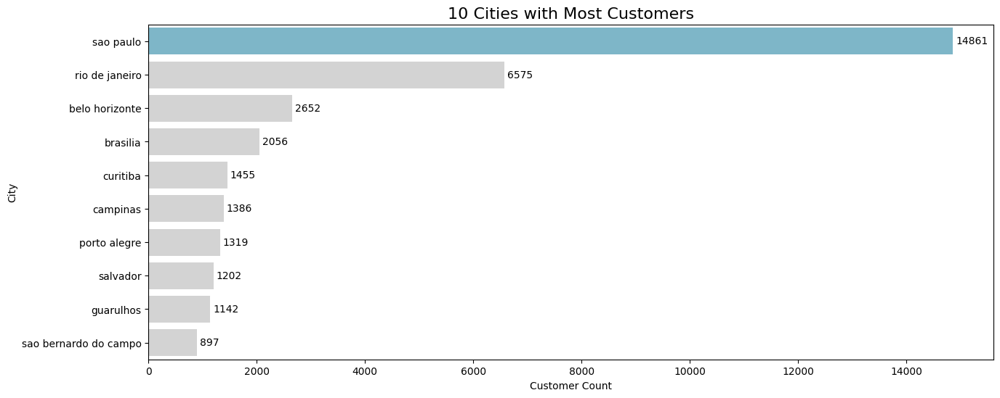

In [112]:
# Visualisasi bar plot untuk 10 kota dengan pelanggan terbanyak
plt.figure(figsize=(15, 6))
colors = ["#72BCD4", "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3",
           "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3"]

sns.barplot(
    y="customer_city",
    x="customer_count",
    data=df_topcity,
    palette= colors
)

for index, value in enumerate(df_topcity["customer_count"]):
    plt.text(value + 50, index, str(value), va='center', fontsize=10)

plt.title("10 Cities with Most Customers", loc="center", fontsize=16)
plt.ylabel("City", fontsize=10)
plt.xlabel("Customer Count", fontsize=10)
plt.tick_params(axis='x', labelsize=10) 
plt.show()

Berdasarkan visualisasi tersebut, terlihat bahwa `Sao Paulo` merupakan kota dengan jumlah pelanggan terbanyak, yaitu 148.661 pelanggan. Jumlah ini sangat besar dan jauh melampaui kota-kota lainnya. Bahkan, kota dengan jumlah pelanggan terbanyak kedua, yaitu `Rio de Janeiro`, hanya memiliki 6.575 pelanggan, kurang dari setengah jumlah pelanggan di `Sao Paulo`. Di bawahnya, terdapat beberapa kota lain dengan jumlah pelanggan di kisaran 1.000 hingga 2.000 pelanggan, seperti `Belo Horizonte`, `Brasilia`, `Curitiba`, `Campinas`, dan kota-kota lainnya.

Data ini menunjukkan bahwa `Sao Paulo` memiliki dominasi yang sangat signifikan dalam jumlah pelanggan, sementara kota-kota lain memiliki pangsa pasar yang jauh lebih kecil.

#### Berdasarkan state

In [113]:
# Membuat dataframe 5 state dengan pelanggan terbanyak
df_topstate = df_alldata.groupby(by="customer_state").customer_unique_id.nunique().reset_index()
df_topstate = df_topstate.sort_values(by = "customer_unique_id", ascending = False).head(5)
df_topstate.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_topstate

,customer_state,customer_count
25,SP,39968
18,RJ,12302
10,MG,11173
22,RS,5248
17,PR,4840


In [114]:
# Membuat dataframe 5 state dengan pelanggan tersedikit
df_lowstate = df_alldata.groupby(by="customer_state").customer_unique_id.nunique().reset_index()
df_lowstate = df_lowstate.sort_values(by = "customer_unique_id", ascending = True).head(5)
df_lowstate.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_lowstate

,customer_state,customer_count
21,RR,45
3,AP,67
0,AC,77
2,AM,142
20,RO,235


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14436\1508101634.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




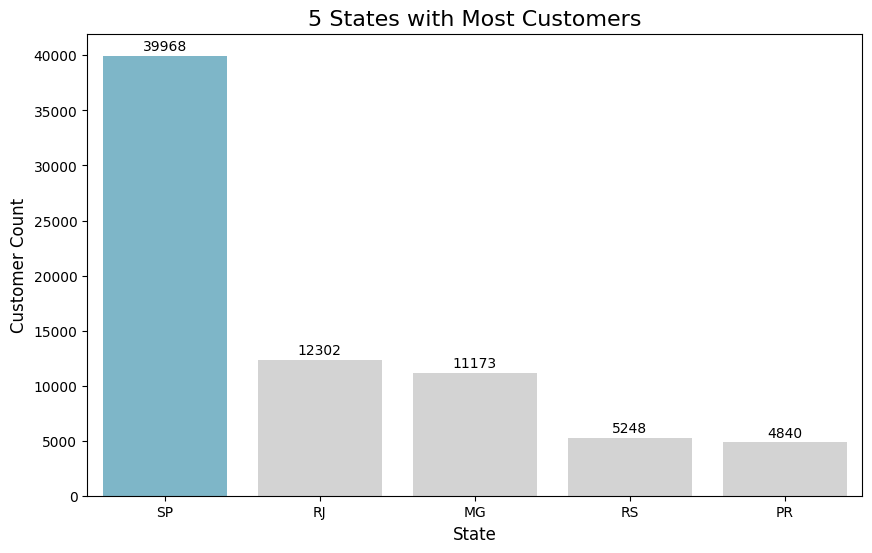

In [115]:
# Visualisasi bar plot untuk 5 state dengan pelanggan terbanyak
plt.figure(figsize=(10, 6))
colors = ["#72BCD4", "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3"]
sns.barplot(
    y="customer_count",
    x="customer_state",
    data=df_topstate,
    palette=colors
)

for index, row in df_topstate.iterrows():
    plt.text(row["customer_state"], row["customer_count"] + 500,  
             str(row["customer_count"]), ha='center', fontsize=10)

plt.title("5 States with Most Customers", loc="center", fontsize=16)
plt.ylabel("Customer Count", fontsize=12)
plt.xlabel("State", fontsize=12)
plt.tick_params(axis='x', labelsize=10) 
plt.show()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14436\711981524.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




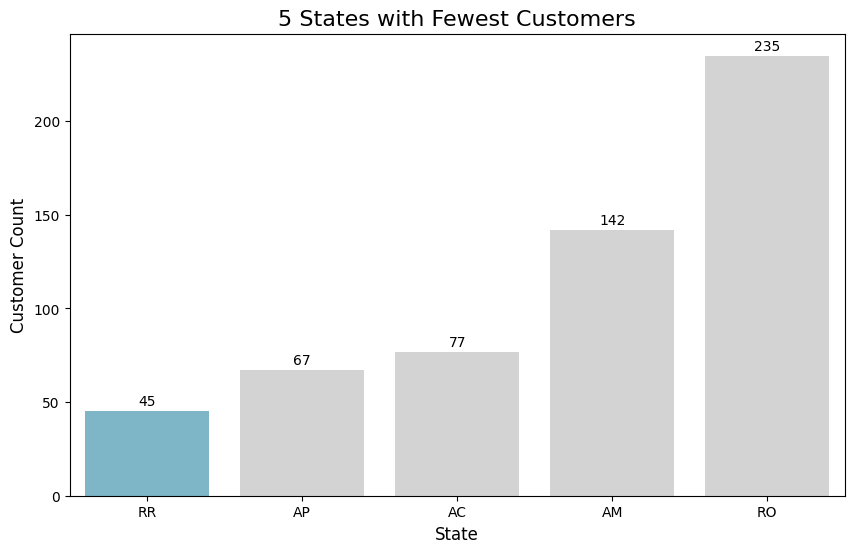

In [116]:
# Visualisasi bar plot untuk 5 state dengan pelanggan tersedikit
plt.figure(figsize=(10, 6))
colors = ["#72BCD4", "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3"]
sns.barplot(
    y="customer_count",
    x="customer_state",
    data=df_lowstate,
    palette=colors
)

for index, row in df_lowstate.iterrows():
    plt.text(row["customer_state"], row["customer_count"] + 3,  
             str(row["customer_count"]), ha='center', fontsize=10)

plt.title("5 States with Fewest Customers", loc="center", fontsize=16)
plt.ylabel("Customer Count", fontsize=12)
plt.xlabel("State", fontsize=12)
plt.tick_params(axis='x', labelsize=10)  
plt.show()

Berdasarkan dua visualisasi di atas, diperoleh informasi mengenai lima state dengan jumlah pelanggan terbanyak dan tersedikit. Pada kategori state dengan jumlah pelanggan terbanyak, `SP` mendominasi dengan hampir 40.000 pelanggan, menjadikannya wilayah dengan basis pelanggan terbesar. Di posisi berikutnya, `RJ` dan `MG` memiliki jumlah pelanggan yang relatif seimbang, masing-masing berada di kisaran 11.000 hingga 12.000 pelanggan. Sementara itu, `RS` dan `PR` melengkapi lima besar dengan jumlah pelanggan di kisaran 5.000 pelanggan.  Sebaliknya, pada kategori state dengan jumlah pelanggan tersedikit, `RR` menjadi state dengan jumlah pelanggan paling sedikit, yaitu hanya 45 pelanggan. Disusul oleh `AP` dan `AC`, yang masing-masing memiliki sekitar 60 hingga 70 pelanggan. Kemudian, `AM` memiliki 142 pelanggan, dan terakhir, `RO` tercatat memiliki 235 pelanggan.  

Dari data ini, terlihat bahwa jumlah pelanggan tersebar tidak merata di berbagai state, dengan `SP` sebagai pusat dominasi pelanggan, sementara beberapa state lainnya memiliki jumlah pelanggan yang sangat terbatas.

#### Berdasarkan kategori produk

In [117]:
# Membuat dataframe 5 kategori produk terfavorit
df_topproduct = df_alldata.groupby(by="product_category_name_english").customer_unique_id.nunique().reset_index()
df_topproduct = df_topproduct.sort_values(by = "customer_unique_id", ascending = False).head(5)
df_topproduct.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_topproduct

,product_category_name_english,customer_count
8,bed_bath_table,9142
44,health_beauty,8675
66,sports_leisure,7513
16,computers_accessories,6555
40,furniture_decor,6308


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14436\3178406334.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




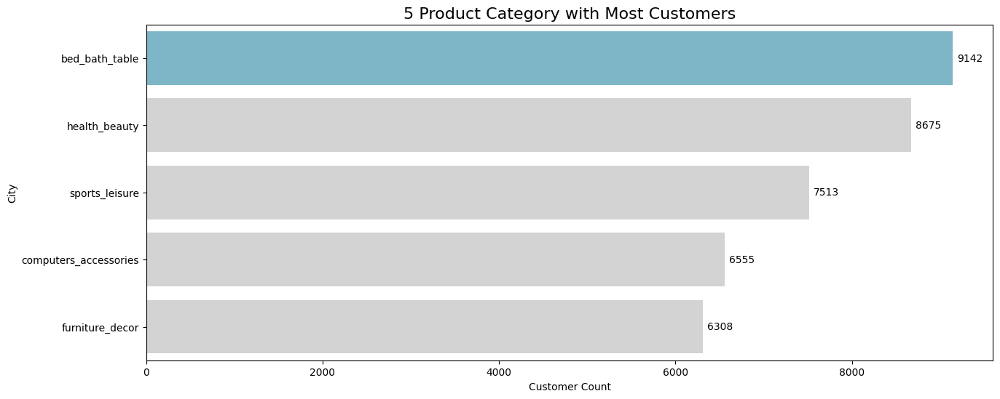

In [118]:
# Visualisasi bar plot untuk 5 kategori terfavorit
plt.figure(figsize=(15, 6))
colors = ["#72BCD4", "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3"]
sns.barplot(
    y="product_category_name_english",
    x="customer_count",
    data=df_topproduct,
    palette=colors 
)

for index, value in enumerate(df_topproduct["customer_count"]):
    plt.text(value + 50, index, str(value), va='center', fontsize=10)

plt.title("5 Product Category with Most Customers", loc="center", fontsize=16)
plt.ylabel("City", fontsize=10)
plt.xlabel("Customer Count", fontsize=10)
plt.tick_params(axis='x', labelsize=10) 
plt.show()

In [119]:
# Membuat dataframe 5 kategori produk dengan jumlah pelanggan terendah
df_lowproduct = df_alldata.groupby(by="product_category_name_english").customer_unique_id.nunique().reset_index()
df_lowproduct = df_lowproduct.sort_values(by = "customer_unique_id", ascending = True).head(5)
df_lowproduct.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_lowproduct

,product_category_name_english,customer_count
62,security_and_services,2
30,fashion_childrens_clothes,8
12,cds_dvds_musicals,12
53,la_cuisine,13
4,arts_and_craftmanship,21


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14436\2824164833.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




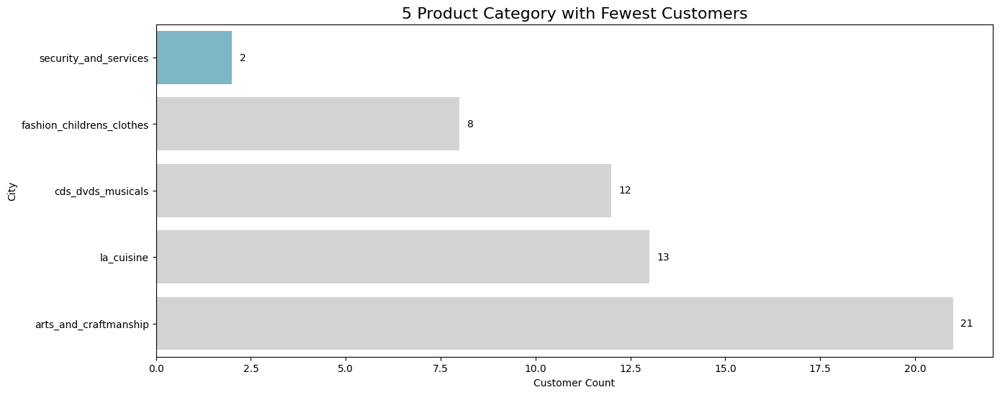

In [120]:
# Visualisasi bar plot untuk 5 kota terbanyak
plt.figure(figsize=(15, 6))
colors = ["#72BCD4", "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3"]
sns.barplot(
    y="product_category_name_english",
    x="customer_count",
    data=df_lowproduct,
    palette=colors
)

for index, value in enumerate(df_lowproduct["customer_count"]):
    plt.text(value + 0.2, index, str(value), va='center', fontsize=10)

plt.title("5 Product Category with Fewest Customers", loc="center", fontsize=16)
plt.ylabel("City", fontsize=10)
plt.xlabel("Customer Count", fontsize=10)
plt.tick_params(axis='x', labelsize=10) 
plt.show()

Berdasarkan dua visualisasi di atas, dapat terlihat kategori produk dengan jumlah pelanggan terbanyak dan tersedikit. Pada visualisasi pertama, kategori `bed_bath_table` memiliki jumlah pelanggan terbanyak, yaitu 9142 pelanggan. Disusul oleh kategori `health_beauty` dengan 8675 pelanggan dan `sports_leisure` dengan 7513 pelanggan. Sementara itu, kategori `computers_accessories` dan `furniture_decor` juga cukup populer dengan jumlah pelanggan di kisaran 6000 pelanggan. Sebaliknya, kategori dengan jumlah pelanggan paling sedikit adalah `security_and_services`, yang hanya memiliki 2 pelanggan. Kemudian, kategori `fashion_childrens_clothes` berada di posisi kedua terbawah dengan 8 pelanggan. Selain itu, kategori `cds_dvds_musicals`, `la_cuisine`, dan `arts_and_craftmanship` juga termasuk dalam kategori dengan jumlah pelanggan yang relatif sedikit.

Data ini menunjukkan bahwa kategori produk seperti bed_bath_table dan health_beauty lebih banyak diminati pelanggan, sementara beberapa kategori lainnya memiliki pangsa pasar yang sangat kecil.

#### Berdasarkan metode pembayaran

In [121]:
# Membuat dataframe jumlah pelanggan berdasarkan metode pembayarannya
df_toppayment = df_alldata.groupby(by="payment_type").customer_unique_id.nunique().reset_index()
df_toppayment = df_toppayment.sort_values(by = "customer_unique_id", ascending = False)
df_toppayment.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_toppayment

,payment_type,customer_count
1,credit_card,73606
0,boleto,19124
3,voucher,3672
2,debit_card,1506


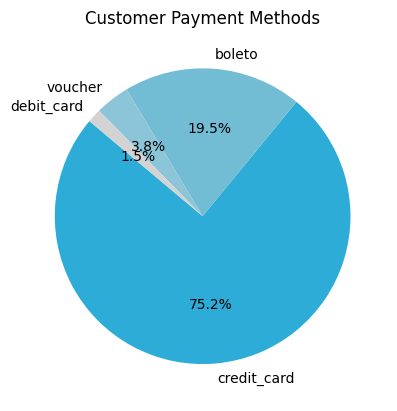

In [122]:
# Pie chart persentase metode pembayaran yang dipilih pelanggan
colors = ["#2cacd6", "#72BCD4", "#8dc5d8", "#D3D3D3"]
plt.pie(df_toppayment['customer_count'], labels=df_toppayment['payment_type'], autopct='%1.1f%%', startangle=140, colors = colors)
plt.title("Customer Payment Methods")
plt.show()

Berdasarkan pie chart tersebut, ditampilkan distribusi metode pembayaran dalam suatu transaksi. `Credit Card` merupakan metode pembayaran yang paling dominan, digunakan dalam 75,2% dari total transaksi. Hal ini menunjukkan bahwa mayoritas pelanggan lebih memilih menggunakan kartu kredit dibandingkan metode pembayaran lainnya. Di posisi kedua, `Boleto` digunakan dalam 19,5% dari total transaksi, menjadikannya alternatif utama setelah kartu kredit. Sementara itu, metode pembayaran `Voucher` dan `Debit Card` memiliki tingkat penggunaan yang jauh lebih rendah, masing-masing hanya 3,8% dan 1,5% dari total transaksi.

Rendahnya persentase penggunaan `Voucher` dan `Debit Card` dapat mengindikasikan bahwa metode ini kurang diminati atau kurang tersedia dalam sistem pembayaran yang digunakan. Secara keseluruhan, data ini menunjukkan preferensi pelanggan yang cenderung lebih memilih metode pembayaran berbasis kredit dibandingkan metode lainnya.

### **Pertanyaan 2:** Bagaimana tren penjualan setiap produk yang dipasarkan di e-commerce ini?

In [123]:
df_alldata['order_purchase_timestamp'] = pd.to_datetime(df_alldata['order_purchase_timestamp'])
df_alldata['order_approved_at'] = pd.to_datetime(df_alldata['order_approved_at'])
df_alldata['order_delivered_carrier_date'] = pd.to_datetime(df_alldata['order_delivered_carrier_date'])
df_alldata['order_delivered_customer_date'] = pd.to_datetime(df_alldata['order_delivered_customer_date'])
df_alldata['order_estimated_delivery_date'] = pd.to_datetime(df_alldata['order_estimated_delivery_date'])


df_alldata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107619 entries, 0 to 107618
Data columns (total 29 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       107619 non-null  object        
 1   customer_id                    107619 non-null  object        
 2   order_status                   107619 non-null  object        
 3   order_purchase_timestamp       107619 non-null  datetime64[ns]
 4   order_approved_at              107619 non-null  datetime64[ns]
 5   order_delivered_carrier_date   106532 non-null  datetime64[ns]
 6   order_delivered_customer_date  105256 non-null  datetime64[ns]
 7   order_estimated_delivery_date  107619 non-null  datetime64[ns]
 8   approval_time_diff             107619 non-null  float64       
 9   delivery_time_diff             105255 non-null  float64       
 10  is_on_time                     107619 non-null  object        
 11  

In [124]:
# Membuat dataframe untuk menghitung jumlah orderan dan banyak revenue yang dihasilkan tiap bulan
monthly_orders_df = df_alldata.resample(rule='ME', on='order_purchase_timestamp').agg({
    "order_id": "nunique",
    "payment_value": "sum"
})

In [125]:
# Menambah variabel baru: Jumlah pelanggan baru tiap bulan
first_purchase_df = df_alldata.groupby("customer_unique_id")["order_purchase_timestamp"].min().reset_index()
first_purchase_df["first_purchase_month"] = first_purchase_df["order_purchase_timestamp"].dt.to_period("M").dt.to_timestamp("M")
new_customers_df = first_purchase_df.groupby("first_purchase_month")["customer_unique_id"].nunique()
monthly_orders_df["customer_count"] = new_customers_df
monthly_orders_df.index = monthly_orders_df.index.strftime('%b-%Y')
monthly_orders_df = monthly_orders_df.reset_index()

In [126]:
# Mengumpulkan ketiga variabel menjadi satu dataframe
monthly_orders_df.rename(columns={
    "order_id": "order_count",
    "customer_unique_id": "customer_count",
    "payment_value": "revenue"
}, inplace=True)

monthly_orders_df["customer_count"] = monthly_orders_df["customer_count"].fillna(0).astype(int)

monthly_orders_df

,order_purchase_timestamp,order_count,revenue,customer_count
0,Sep-2016,2,347.52,2
1,Oct-2016,304,60480.88,301
2,Nov-2016,0,0.00,0
3,Dec-2016,1,19.62,1
4,Jan-2017,788,146355.67,754
5,Feb-2017,1731,301839.98,1703
6,Mar-2017,2640,455334.27,2594
7,Apr-2017,2391,429654.78,2339
8,May-2017,3659,624943.09,3559
9,Jun-2017,3216,541319.30,3113


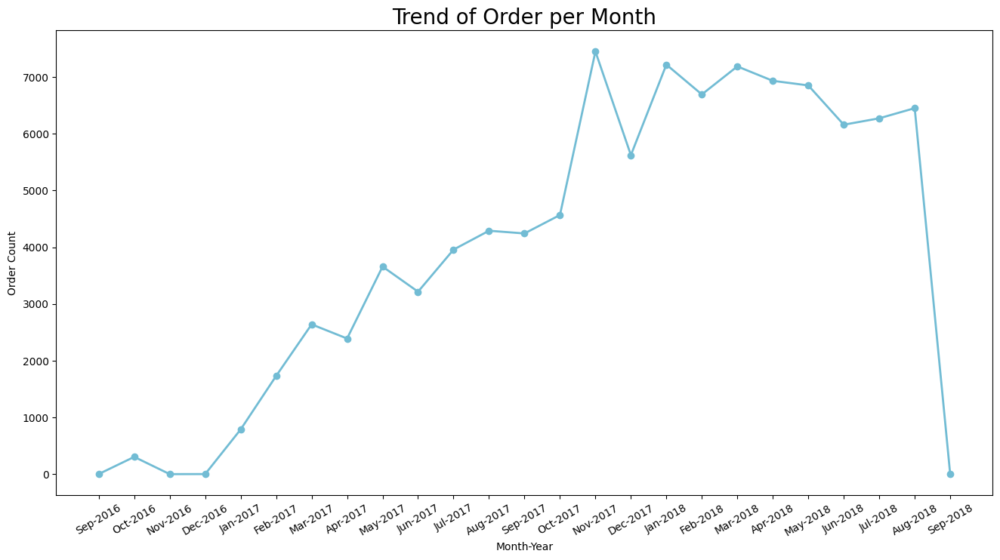

In [127]:
# Line Chart Jumlah Orderan tiap Bulan
plt.figure(figsize=(16, 8))
plt.plot(
    monthly_orders_df["order_purchase_timestamp"],
    monthly_orders_df["order_count"],
    marker='o', 
    linewidth=2,
    color="#72BCD4"
)

plt.title("Trend of Order per Month", loc="center", fontsize=20)
plt.xlabel('Month-Year')
plt.ylabel('Order Count')
plt.xticks(fontsize=10, rotation = 30)
plt.yticks(fontsize=10)
plt.show()

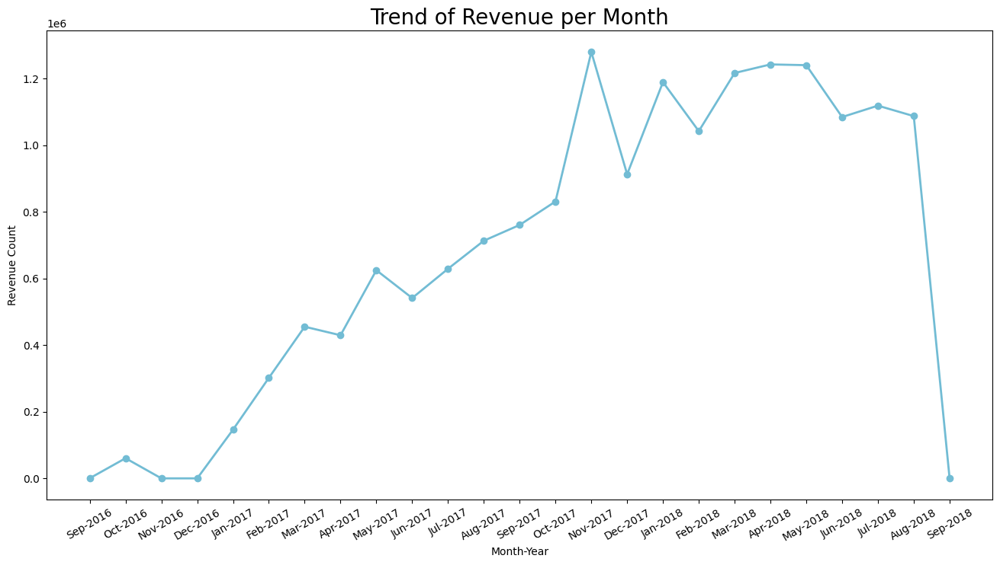

In [128]:
# Line Chart Jumlah Orderan tiap Bulan
plt.figure(figsize=(16, 8))
plt.plot(
    monthly_orders_df["order_purchase_timestamp"],
    monthly_orders_df["revenue"],
    marker='o', 
    linewidth=2,
    color="#72BCD4"
)


plt.title("Trend of Revenue per Month", loc="center", fontsize=20)
plt.xlabel('Month-Year')
plt.ylabel('Revenue Count')
plt.xticks(fontsize=10, rotation = 30)
plt.yticks(fontsize=10)
plt.show()

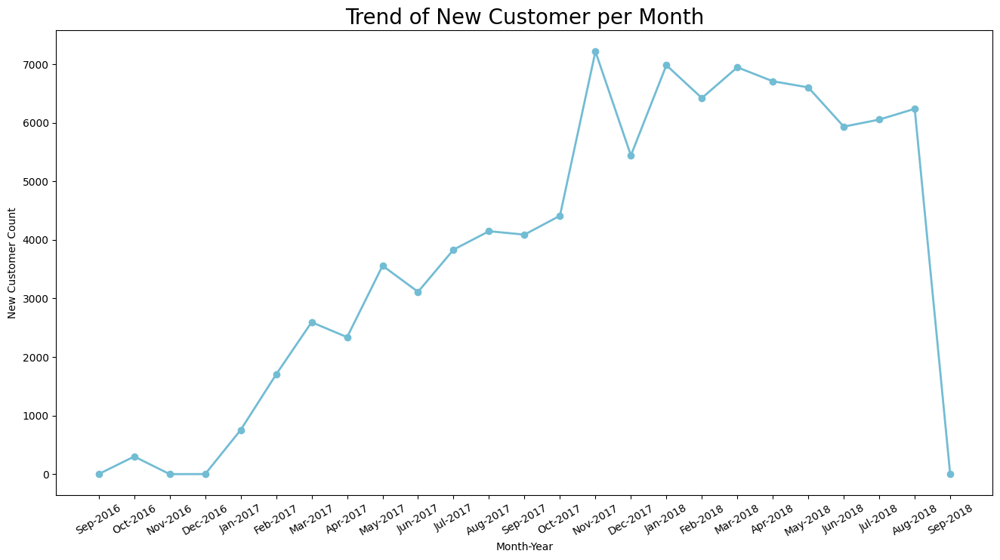

In [129]:
# Line Chart Jumlah Pelanggan Baru tiap Bulan
plt.figure(figsize=(16, 8))
plt.plot(
    monthly_orders_df["order_purchase_timestamp"],
    monthly_orders_df["customer_count"],
    marker='o', 
    linewidth=2,
    color="#72BCD4"
)


plt.title("Trend of New Customer per Month", loc="center", fontsize=20)
plt.xlabel('Month-Year')
plt.ylabel('New Customer Count')
plt.xticks(fontsize=10, rotation = 30)
plt.yticks(fontsize=10)
plt.show()

Berdasarkan tiga line chart yang menunjukkan jumlah order, revenue, dan pelanggan baru tiap bulan, terlihat bahwa ketiganya memiliki pola yang serupa. Tren peningkatan dimulai sejak September 2016, mencapai puncaknya pada November 2017, di mana jumlah order dan pelanggan baru masing-masing mencapai sekitar 7.000, sementara revenue mencapai 1.200.000 BRL. Setelah itu, kondisi menjadi tidak stabil, dengan fluktuasi naik-turun hingga Agustus 2018. Selama periode ini, jumlah order dan pelanggan baru cenderung bertahan di sekitar 6.000, sedangkan revenue berada di kisaran 1.000.000 BRL. Tren ini menunjukkan bahwa setelah mengalami pertumbuhan pesat, bisnis memasuki fase fluktuatif, meskipun tetap berada pada tingkat yang relatif tinggi dibandingkan periode awal.

### **Pertanyaan 3:** Bagaimana performa penjual/seller yang berada di e-commerce ini?

#### Berdasarkan banyak transaksi pelanggan

In [130]:
# Membuat variabel baru: menghitung banyak transaksi tiap pelanggan
df_topcustomer = df_alldata.groupby(by="customer_unique_id").order_id.nunique().reset_index()
df_topcustomer = df_topcustomer.sort_values(by = "order_id", ascending = False)
df_topcustomer.rename(columns={"order_id": "order_count"}, inplace=True)
df_topcustomer

,customer_unique_id,order_count
52585,8d50f5eadf50201ccdcedfb9e2ac8455,16
23298,3e43e6105506432c953e165fb2acf44c,9
10277,1b6c7548a2a1f9037c1fd3ddfed95f33,7
37525,6469f99c1f9dfae7733b25662e7f1782,7
75540,ca77025e7201e3b30c44b472ff346268,7
...,...,...
32265,5657596addb4d7b07b32cd330614bdf8,1
32264,5656eb169546146caeab56c3ffc3d268,1
32263,5656a8fabc8629ff96b2bc14f8c09a27,1
32262,56560124a5cc70119deb685775639ea7,1


In [131]:
# Membuat kategorisasi jumlah transaksi pelanggan
def kategori(score):
    if score > 5:
        return "Lebih dari 5 kali"
    elif score >= 2:
        return "2 sampai 5 kali"
    else:
        return "1 kali"

df_topcustomer['order_category'] = df_topcustomer['order_count'].apply(kategori)
df_topcustomer


,customer_unique_id,order_count,order_category
52585,8d50f5eadf50201ccdcedfb9e2ac8455,16,Lebih dari 5 kali
23298,3e43e6105506432c953e165fb2acf44c,9,Lebih dari 5 kali
10277,1b6c7548a2a1f9037c1fd3ddfed95f33,7,Lebih dari 5 kali
37525,6469f99c1f9dfae7733b25662e7f1782,7,Lebih dari 5 kali
75540,ca77025e7201e3b30c44b472ff346268,7,Lebih dari 5 kali
...,...,...,...
32265,5657596addb4d7b07b32cd330614bdf8,1,1 kali
32264,5656eb169546146caeab56c3ffc3d268,1,1 kali
32263,5656a8fabc8629ff96b2bc14f8c09a27,1,1 kali
32262,56560124a5cc70119deb685775639ea7,1,1 kali


In [132]:
# Membuat dataframe berisi banyak pelanggan berdasarkan frekuensi pembeliannya
df_topcustomer2 = df_topcustomer.groupby(by="order_category").customer_unique_id.nunique().reset_index()
df_topcustomer2 = df_topcustomer2.sort_values(by = "customer_unique_id", ascending = False)
df_topcustomer2.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_topcustomer2

,order_category,customer_count
0,1 kali,92489
1,2 sampai 5 kali,2900
2,Lebih dari 5 kali,10


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14436\1269849039.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




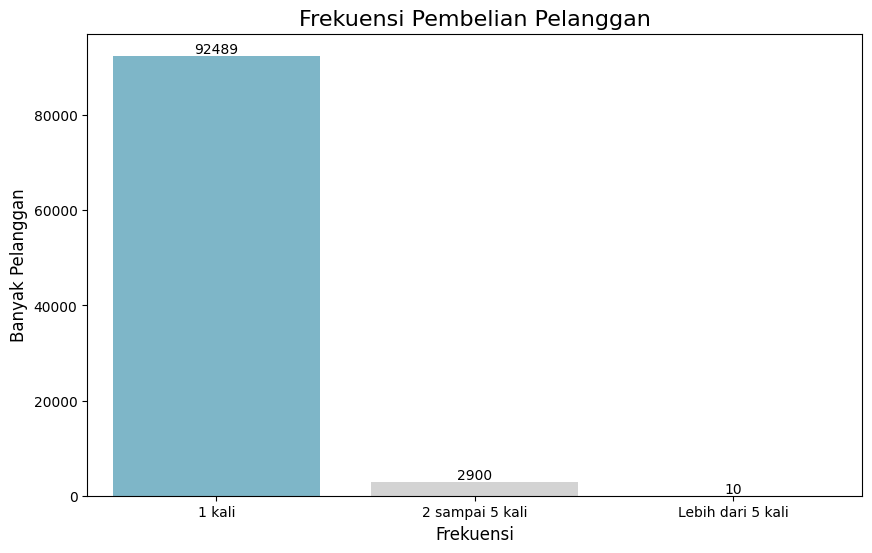

In [133]:
# Visualisasi bar plot untuk jumlah pelanggan berdasarkan frekuensi pembeliannya
plt.figure(figsize=(10, 6))
colors = ["#72BCD4", "#D3D3D3", "#D3D3D3"]
sns.barplot(
    y="customer_count",
    x="order_category",
    data=df_topcustomer2,
    palette=colors
)

# Menambahkan angka di atas setiap bar dengan plt.text()
for index, row in df_topcustomer2.iterrows():
    plt.text(row["order_category"], row["customer_count"] + 500,  # Sesuaikan offset
             str(row["customer_count"]), ha='center', fontsize=10)

plt.title("Frekuensi Pembelian Pelanggan", loc="center", fontsize=16)
plt.ylabel("Banyak Pelanggan", fontsize=12)
plt.xlabel("Frekuensi", fontsize=12)
plt.tick_params(axis='x', labelsize=10)  # Rotate labels on x-axis
plt.show()

Berdasarkan bar chart mengenai frekuensi pembelian pelanggan, mayoritas pelanggan (92.489 pelanggan) hanya melakukan 1 kali pembelian, menunjukkan bahwa sebagian besar pelanggan tidak kembali untuk bertransaksi ulang dan orderan justru didominasi oleh banyak pelanggan baru. Sementara itu, terdapat 2.900 pelanggan yang melakukan pembelian sebanyak 2 hingga 5 kali, yang masih tergolong sedikit dibandingkan total pelanggan. Adapun pelanggan yang melakukan pembelian lebih dari 5 kali sangat sedikit, yakni hanya 10 pelanggan. Data ini mengindikasikan bahwa tingkat retensi pelanggan sangat rendah, dengan dominasi pelanggan satu kali pembelian dan hanya sedikit pelanggan yang melakukan transaksi berulang.

#### Berdasarkan review pelanggan

In [134]:
# Membuat dataframe berdasarkan tingkat kepuasan pelanggan
df_topreview = df_alldata.groupby(by="review_category").customer_unique_id.nunique().reset_index()
df_topreview = df_topreview.sort_values(by = "customer_unique_id", ascending = False)
df_topreview.rename(columns={"customer_unique_id": "customer_count"}, inplace=True)
df_topreview

,review_category,customer_count
1,Puas,73750
3,Tidak Puas,13697
0,Netral,7996
2,Tidak Mengisi,738


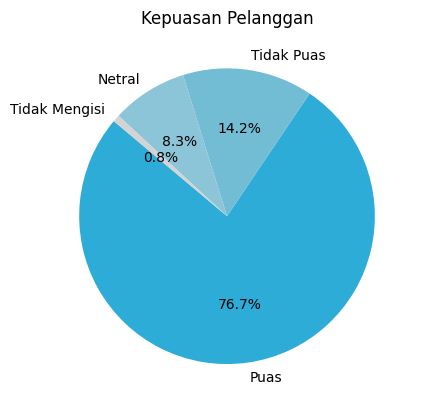

In [135]:
# Pie chart tingkat kepuasan pelanggan
colors = ["#2cacd6", "#72BCD4", "#8dc5d8", "#D3D3D3"]
plt.pie(df_topreview['customer_count'], labels=df_topreview['review_category'], autopct='%1.1f%%', startangle=140, colors = colors)
plt.title("Kepuasan Pelanggan")
plt.show()

Berdasarkan pie chart mengenai kepuasan pelanggan, mayoritas pelanggan, yaitu 76,7%, merasa puas dengan layanan atau produk yang diberikan di e-commerce Olist. Sementara itu, 14,2% pelanggan menyatakan tidak puas, menunjukkan adanya beberapa aspek yang perlu diperbaiki. Sebanyak 8,3% pelanggan bersikap netral, yang berarti mereka tidak secara khusus merasa puas atau tidak puas. Selain itu, terdapat 0,8% pelanggan yang tidak mengisi survei kepuasan. Secara keseluruhan, tingkat kepuasan pelanggan cukup tinggi, namun masih terdapat sebagian pelanggan yang merasa kurang puas, yang dapat menjadi perhatian untuk peningkatan layanan.

### **Pertanyaan 4:** Bagaimana distribusi pengiriman pesanan yang terjual dari e-commerce ini?

In [136]:
fig = px.box(df_alldata, y='approval_time_diff', title='Boxplot of Approval Time Different (Days)')
fig.show()

Boxplot di atas menunjukkan bahwa mayoritas waktu persetujuan order terjadi dalam rentang waktu yang relatif singkat, yaitu kurang dari satu hari. Namun, terdapat beberapa outlier signifikan yang mencapai lebih dari 60 hari, menunjukkan bahwa sebagian kecil persetujuan mengalami keterlambatan ekstrem. Secara keseluruhan, meskipun proses persetujuan umumnya cepat, adanya beberapa kasus keterlambatan yang cukup besar perlu dianalisis lebih lanjut untuk memahami faktor penyebabnya.

In [137]:
fig = px.box(df_alldata, y='delivery_time_diff', title='Boxplot of Delivery Time Different (Days)')
fig.show()

Pada visualisasi boxplot di atas, ditunjukkan bahwa mayoritas pengiriman memiliki perbedaan waktu yang relatif kecil, dengan rentang interkuartil (IQR) yang sempit, yakni sekitar 4 sampai 12 hari saja, menandakan bahwa sebagian besar pengiriman berjalan sesuai jadwal. Namun, terdapat sejumlah outlier ekstrem dengan perbedaan waktu pengiriman yang sangat tinggi, bahkan mencapai lebih dari 100 hingga 200 hari. Hal ini mengindikasikan adanya beberapa kasus keterlambatan signifikan yang kemungkinan disebabkan oleh faktor logistik, kendala operasional, atau kesalahan pencatatan data. Meskipun distribusi utama menunjukkan kinerja pengiriman yang stabil, keberadaan outlier ini perlu dianalisis lebih lanjut untuk mengidentifikasi dan mengatasi penyebab keterlambatan.

In [138]:
# Membuat dataframe berdasarkan keterlambatan pengiriman order
df_ontime = df_alldata.groupby(by="is_on_time").order_id.nunique().reset_index()
df_ontime = df_ontime.sort_values(by = "order_id", ascending = False)
df_ontime.rename(columns={"order_id": "order_count"}, inplace=True)
df_ontime

,is_on_time,order_count
1,Yes,88626
0,No,10016


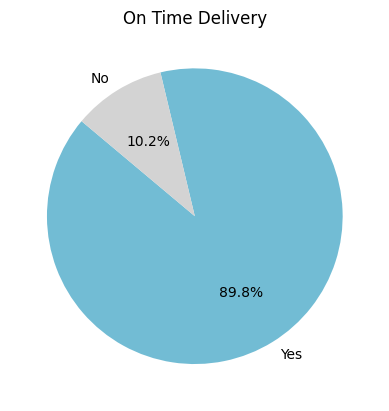

In [139]:
# Pie chart keterlambatan pengiriman
colors = ["#72BCD4","#D3D3D3"]
plt.pie(df_ontime['order_count'], labels=df_ontime['is_on_time'], autopct='%1.1f%%', startangle=140, colors = colors)
plt.title("On Time Delivery")
plt.show()

Pie chart tersebut menunjukkan bahwa mayoritas pengiriman sampai ke pelanggan tepat waktu, dengan persentase sebesar 89.8%. Sementara itu, 10.2% pengiriman mengalami keterlambatan. Persentase ketepatan waktu yang tinggi menunjukkan efektivitas sistem logistik yang baik. Namun, meskipun jumlah pengiriman yang terlambat relatif kecil, tetap perlu dianalisis lebih lanjut untuk mengidentifikasi penyebab keterlambatan agar dapat meningkatkan efisiensi pengiriman lebih lanjut.

## **RFM Analysis**

Analisis RFM (Recency, Frequency, Monetary) digunakan pada kasus e-commerce Olist karena mampu mengidentifikasi pelanggan bernilai tinggi, melakukan segmentasi yang lebih akurat, dan meningkatkan efektivitas pemasaran. Dengan mengukur kapan terakhir pelanggan bertransaksi (Recency), seberapa sering mereka berbelanja (Frequency), dan total pengeluaran mereka (Monetary), e-commerce dapat mengoptimalkan strategi mempertahankan pelanggan, mencegah churn, serta mengalokasikan kebutuhan pemasaran secara efisien. Selain itu, RFM mudah diimplementasikan karena hanya memerlukan data transaksi yang sudah tersedia, menjadikannya alat yang praktis dan efektif dalam meningkatkan loyalitas pelanggan serta profitabilitas bisnis.

In [140]:
df_rfm =df_alldata.groupby(by="customer_unique_id", as_index=False).agg({
    "order_purchase_timestamp": "max", #mengambil tanggal order terakhir
    "order_id": "nunique",
    "payment_value": "sum"
})
df_rfm.columns = ["customer_id", "max_order_timestamp", "frequency", "monetary"]
df_rfm

,customer_id,max_order_timestamp,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,1,27.19
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,1,196.89
...,...,...,...,...
95394,fffcf5a5ff07b0908bd4e2dbc735a684,2017-06-08 21:00:36,1,4134.84
95395,fffea47cd6d3cc0a88bd621562a9d061,2017-12-10 20:07:56,1,84.58
95396,ffff371b4d645b6ecea244b27531430a,2017-02-07 15:49:16,1,112.46
95397,ffff5962728ec6157033ef9805bacc48,2018-05-02 15:17:41,1,133.69


In [141]:
# Menghitung kapan terakhir pelanggan melakukan transaksi (hari)
df_rfm["max_order_timestamp"] = df_rfm["max_order_timestamp"].dt.date
recent_date = df_alldata["order_purchase_timestamp"].dt.date.max()
df_rfm["recency"] = df_rfm["max_order_timestamp"].apply(lambda x: (recent_date - x).days)
df_rfm

,customer_id,max_order_timestamp,frequency,monetary,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10,1,141.90,116
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07,1,27.19,119
2,0000f46a3911fa3c0805444483337064,2017-03-10,1,86.22,542
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12,1,43.62,326
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14,1,196.89,293
...,...,...,...,...,...
95394,fffcf5a5ff07b0908bd4e2dbc735a684,2017-06-08,1,4134.84,452
95395,fffea47cd6d3cc0a88bd621562a9d061,2017-12-10,1,84.58,267
95396,ffff371b4d645b6ecea244b27531430a,2017-02-07,1,112.46,573
95397,ffff5962728ec6157033ef9805bacc48,2018-05-02,1,133.69,124


In [142]:
df_rfm.drop("max_order_timestamp", axis=1, inplace=True)
df_rfm

,customer_id,frequency,monetary,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,1,141.90,116
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19,119
2,0000f46a3911fa3c0805444483337064,1,86.22,542
3,0000f6ccb0745a6a4b88665a16c9f078,1,43.62,326
4,0004aac84e0df4da2b147fca70cf8255,1,196.89,293
...,...,...,...,...
95394,fffcf5a5ff07b0908bd4e2dbc735a684,1,4134.84,452
95395,fffea47cd6d3cc0a88bd621562a9d061,1,84.58,267
95396,ffff371b4d645b6ecea244b27531430a,1,112.46,573
95397,ffff5962728ec6157033ef9805bacc48,1,133.69,124


In [143]:
df_rfm.describe()

,frequency,monetary,recency
count,95399.000000,95399.000000,95399.000000
mean,1.033994,177.274704,243.444460
std,0.211187,269.636813,153.118755
min,1.000000,9.590000,0.000000
25%,1.000000,63.270000,119.000000
50%,1.000000,109.410000,224.000000
75%,1.000000,188.940000,353.000000
max,16.000000,15978.650000,729.000000


In [144]:
df_rfm['r_rank'] = df_rfm['recency'].rank(ascending=False)
df_rfm['f_rank'] = df_rfm['frequency'].rank(ascending=True)
df_rfm['m_rank'] = df_rfm['monetary'].rank(ascending=True)

df_rfm

,customer_id,frequency,monetary,recency,r_rank,f_rank,m_rank
0,0000366f3b9a7992bf8c76cfdf3221e2,1,141.90,116,72666.0,46245.0,59508.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19,119,71687.0,46245.0,2067.5
2,0000f46a3911fa3c0805444483337064,1,86.22,542,3420.0,46245.0,37176.5
3,0000f6ccb0745a6a4b88665a16c9f078,1,43.62,326,27451.5,46245.0,11604.0
4,0004aac84e0df4da2b147fca70cf8255,1,196.89,293,32229.5,46245.0,73067.5
...,...,...,...,...,...,...,...
95394,fffcf5a5ff07b0908bd4e2dbc735a684,1,4134.84,452,11777.0,46245.0,95368.0
95395,fffea47cd6d3cc0a88bd621562a9d061,1,84.58,267,39601.0,46245.0,36286.0
95396,ffff371b4d645b6ecea244b27531430a,1,112.46,573,1465.0,46245.0,48764.0
95397,ffff5962728ec6157033ef9805bacc48,1,133.69,124,70404.0,46245.0,56663.0


In [145]:
# Normalisasi rank tiap customer
df_rfm['r_rank_norm'] = (df_rfm['r_rank']/df_rfm['r_rank'].max())*100
df_rfm['f_rank_norm'] = (df_rfm['f_rank']/df_rfm['f_rank'].max())*100
df_rfm['m_rank_norm'] = (df_rfm['m_rank']/df_rfm['m_rank'].max())*100
 
df_rfm.drop(columns=['r_rank', 'f_rank', 'm_rank'], inplace=True)
 
df_rfm.head()

,customer_id,frequency,monetary,recency,r_rank_norm,f_rank_norm,m_rank_norm
0,0000366f3b9a7992bf8c76cfdf3221e2,1,141.90,116,76.170610,48.475351,62.378012
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19,119,75.144394,48.475351,2.167213
2,0000f46a3911fa3c0805444483337064,1,86.22,542,3.584943,48.475351,38.969486
3,0000f6ccb0745a6a4b88665a16c9f078,1,43.62,326,28.775459,48.475351,12.163650
4,0004aac84e0df4da2b147fca70cf8255,1,196.89,293,33.783897,48.475351,76.591474


In [146]:
# Menghitung RFM Score (Notes: bobot ditentukan sendiri, dikarenakan ini merupakan case e-commerce, maka variabel Frequency dan Monetary akan diutamakan, sehingga bobotnya lebih besar)
df_rfm['RFM_score'] = 0.20*df_rfm['r_rank_norm']+0.40 * \
    df_rfm['f_rank_norm']+0.40*df_rfm['m_rank_norm']
df_rfm['RFM_score'] *= 0.05
df_rfm = df_rfm.round(2)
df_rfm[['customer_id', 'RFM_score']]

,customer_id,RFM_score
0,0000366f3b9a7992bf8c76cfdf3221e2,2.98
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1.76
2,0000f46a3911fa3c0805444483337064,1.78
3,0000f6ccb0745a6a4b88665a16c9f078,1.50
4,0004aac84e0df4da2b147fca70cf8255,2.84
...,...,...
95394,fffcf5a5ff07b0908bd4e2dbc735a684,3.09
95395,fffea47cd6d3cc0a88bd621562a9d061,2.15
95396,ffff371b4d645b6ecea244b27531430a,2.01
95397,ffff5962728ec6157033ef9805bacc48,2.90


In [147]:
# Melakukan segmentasi pelanggan berdasarkan RFM Score-nya
df_rfm["customer_segment"] = np.where(
    df_rfm['RFM_score'] > 4.5, "Top customers", (np.where(
        df_rfm['RFM_score'] > 4, "High value customer",(np.where(
            df_rfm['RFM_score'] > 3, "Medium value customer", np.where(
                df_rfm['RFM_score'] > 1.6, 'Low value customers', 'lost customers'))))))

df_rfm[['customer_id', 'RFM_score', 'customer_segment']]

,customer_id,RFM_score,customer_segment
0,0000366f3b9a7992bf8c76cfdf3221e2,2.98,Low value customers
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1.76,Low value customers
2,0000f46a3911fa3c0805444483337064,1.78,Low value customers
3,0000f6ccb0745a6a4b88665a16c9f078,1.50,lost customers
4,0004aac84e0df4da2b147fca70cf8255,2.84,Low value customers
...,...,...,...
95394,fffcf5a5ff07b0908bd4e2dbc735a684,3.09,Medium value customer
95395,fffea47cd6d3cc0a88bd621562a9d061,2.15,Low value customers
95396,ffff371b4d645b6ecea244b27531430a,2.01,Low value customers
95397,ffff5962728ec6157033ef9805bacc48,2.90,Low value customers


In [148]:
df_customers_segment = df_rfm.groupby(by="customer_segment", as_index=False).customer_id.nunique()
df_customers_segment = df_customers_segment.sort_values(by = "customer_id", ascending = False)
df_customers_segment.rename(columns={"customer_id": "customer_count"}, inplace=True)
df_customers_segment


,customer_segment,customer_count
1,Low value customers,62202
2,Medium value customer,21855
4,lost customers,9621
0,High value customer,1188
3,Top customers,533


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14436\3395869738.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




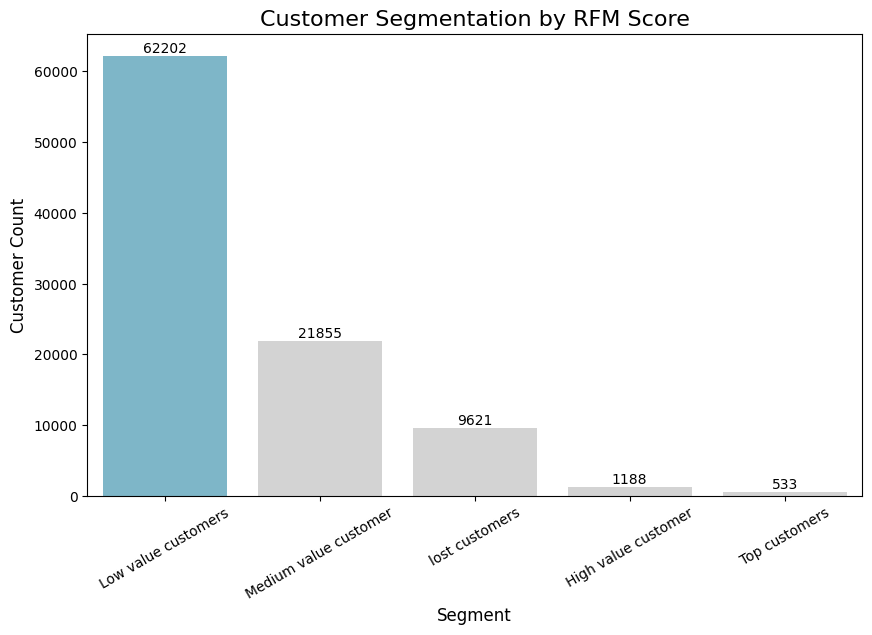

In [149]:
# Visualisasi bar plot untuk segmentasi pelanggan
colors = ["#72BCD4", "#D3D3D3", "#D3D3D3", "#D3D3D3", "#D3D3D3"]
plt.figure(figsize=(10, 6))
sns.barplot(
    y="customer_count",
    x="customer_segment",
    data=df_customers_segment,
    palette=colors
)

for index, row in df_customers_segment.iterrows():
    plt.text(row["customer_segment"], row["customer_count"] + 500, 
             str(row["customer_count"]), ha='center', fontsize=10)

plt.title("Customer Segmentation by RFM Score", loc="center", fontsize=16)
plt.ylabel("Customer Count", fontsize=12)
plt.xlabel("Segment", fontsize=12)
plt.tick_params(axis='x', labelsize=10, rotation = 30)
plt.show()

Grafik batang ini menunjukkan segmentasi pelanggan berdasarkan skor RFM (Recency, Frequency, Monetary). Mayoritas pelanggan berada dalam kategori Low Value Customers (62.202 pelanggan), yang menunjukkan bahwa sebagian besar pelanggan memiliki nilai transaksi yang rendah atau tidak sering bertransaksi. Selanjutnya, terdapat kategori Medium Value Customers berjumlah 21.855 pelanggan, diikuti oleh Lost Customers sebanyak 9.621, yang kemungkinan besar pelanggan pada kategori tersebut sudah tidak aktif. Sementara itu, hanya sedikit pelanggan yang masuk dalam kategori High Value Customers (1.188) dan Top Customers (533), menunjukkan bahwa hanya sebagian kecil pelanggan yang sangat bernilai bagi e-commerce Olist. Distribusi ini menunjukkan bahwa upaya retensi dan strategi pemasaran sebaiknya difokuskan pada meningkatkan nilai pelanggan di kategori bawah agar berpindah ke segmen yang lebih tinggi.

## **Conclusion**

### **Pertanyaan 1:** Bagaimana segmentasi pelanggan yang berbelanja di e-commerce ini?

**Insights:**
- Didapatkan bahwa `Sao Paulo` merupakan kota dengan jumlah pelanggan terbanyak, yaitu 148.661 pelanggan. Jumlah ini sangat besar dan jauh melampaui kota-kota lainnya. Bahkan, kota dengan jumlah pelanggan terbanyak kedua, yaitu `Rio de Janeiro`, hanya memiliki 6.575 pelanggan, kurang dari setengah jumlah pelanggan di `Sao Paulo`. Di bawahnya, terdapat beberapa kota lain dengan jumlah pelanggan di kisaran 1.000 hingga 2.000 pelanggan, seperti `Belo Horizonte`, `Brasilia`, `Curitiba`, `Campinas`, dan kota-kota lainnya.
- Pada kategori state dengan jumlah pelanggan terbanyak, `SP` mendominasi dengan hampir 40.000 pelanggan, menjadikannya wilayah dengan basis pelanggan terbesar. Di posisi berikutnya, `RJ` dan `MG` memiliki jumlah pelanggan yang relatif seimbang, masing-masing berada di kisaran 11.000 hingga 12.000 pelanggan. Sementara itu, `RS` dan `PR` melengkapi lima besar dengan jumlah pelanggan di kisaran 5.000 pelanggan.
- Sebaliknya, pada kategori state dengan jumlah pelanggan tersedikit, `RR` menjadi state dengan jumlah pelanggan paling sedikit, yaitu hanya 45 pelanggan. Disusul oleh `AP` dan `AC`, yang masing-masing memiliki sekitar 60 hingga 70 pelanggan. Kemudian, `AM` memiliki 142 pelanggan, dan terakhir, `RO` tercatat memiliki 235 pelanggan.  
- Kategori `bed_bath_table` memiliki jumlah pelanggan terbanyak, yaitu 9142 pelanggan. Disusul oleh kategori `health_beauty` dengan 8675 pelanggan dan `sports_leisure` dengan 7513 pelanggan. Sementara itu, kategori `computers_accessories` dan `furniture_decor` juga cukup populer dengan jumlah pelanggan di kisaran 6000 pelanggan.
- Sebaliknya, kategori dengan jumlah pelanggan paling sedikit adalah `security_and_services`, yang hanya memiliki 2 pelanggan. Kemudian, kategori `fashion_childrens_clothes` berada di posisi kedua terbawah dengan 8 pelanggan. Selain itu, kategori `cds_dvds_musicals`, `la_cuisine`, dan `arts_and_craftmanship` juga termasuk dalam kategori dengan jumlah pelanggan yang relatif sedikit.
- `Credit Card` merupakan metode pembayaran yang paling dominan, digunakan dalam 75,2% dari total transaksi. Hal ini menunjukkan bahwa mayoritas pelanggan lebih memilih menggunakan kartu kredit dibandingkan metode pembayaran lainnya. Di posisi kedua, `Boleto` digunakan dalam 19,5% dari total transaksi, menjadikannya alternatif utama setelah kartu kredit. Sementara itu, metode pembayaran `Voucher` dan `Debit Card` memiliki tingkat penggunaan yang jauh lebih rendah, masing-masing hanya 3,8% dan 1,5% dari total transaksi.

**Rekomendasi Bisnis:**
- Optimalisasi pasar, misal: wilayah-wilayah yang berpotensi menghasilkan jumlah pelanggan yang lebih banyak, seperti Rio de Janeiro dan kota-kota dengan 1.000 - 2.000 pelanggan  diberikan strategi pemasaran yang lebih agresif.
- Penguatan produk terlaris, misal: memberikan penawaran menarik seperti diskon untuk pembelian produk berkategori `bed_bath_table`, `health_beauty`, dan `sports_leisure`. Selain itu, lakukan pula analisis pola pembelian pelanggan (contoh: Market Basket Analysis), untuk melihat apakah ada kecenderungan pelanggan membeli produk lain setelah produk utama terbeli.
- Optimasi metode pembayaran, misal: menawarkan promo cicilan atau cashback apabila melakukan pembayaran dengan `Credit Card`.

### **Pertanyaan 2:** Bagaimana tren penjualan setiap produk yang dipasarkan di e-commerce ini?

**Insights:**
- Terlihat bahwa tren order, revenue, dan pelanggan baru pada e-commerce Olist memiliki pola yang serupa, yaitu peningkatan dimulai sejak September 2016, lalu mencapai puncaknya pada November 2017, di mana jumlah order dan pelanggan baru masing-masing mencapai sekitar 7.000, sementara revenue mencapai 1.200.000 BRL. Setelah itu, kondisi menjadi tidak stabil, dengan fluktuasi naik-turun hingga Agustus 2018. Selama periode ini, jumlah order dan pelanggan baru cenderung bertahan di sekitar 6.000, sedangkan revenue berada di kisaran 1.000.000 BRL. Tren ini menunjukkan bahwa setelah mengalami pertumbuhan pesat, bisnis memasuki fase fluktuatif, meskipun tetap berada pada tingkat yang relatif tinggi dibandingkan periode awal.

**Rekomendasi Bisnis:**
- Lakukan evaluasi dan identifikasi faktor yang mendorong peningkatan order, revenue, dan pelanggan baru pada November 2017. Coba kembali lakukan strategi tersebut untuk periode mendatang guna melihat signifikansi faktornya.
- Lakukan langkah mitigasi apabila terjadi tren menurun, seperti kampanye produk, promo bundling, dan lain sebagainya.

### **Pertanyaan 3:** Bagaimana performa penjual/seller yang berada di e-commerce ini?

**Insights:**
- Mayoritas pelanggan (92.489 pelanggan) hanya melakukan 1 kali pembelian, menunjukkan bahwa sebagian besar pelanggan tidak kembali untuk bertransaksi ulang dan orderan justru didominasi oleh banyak pelanggan baru. Sementara itu, terdapat 2.900 pelanggan yang melakukan pembelian sebanyak 2 hingga 5 kali, yang masih tergolong sedikit dibandingkan total pelanggan. Adapun pelanggan yang melakukan pembelian lebih dari 5 kali masih sangat sedikit, yakni hanya 10 pelanggan. Data ini mengindikasikan bahwa tingkat retensi pelanggan sangat rendah, dengan dominasi pelanggan satu kali pembelian dan hanya sedikit pelanggan yang melakukan transaksi berulang.
- Diketahui 76,7% pelanggan merasa puas dengan layanan atau produk yang diberikan di e-commerce Olist. Sementara itu, 14,2% pelanggan menyatakan tidak puas, menunjukkan adanya beberapa aspek yang perlu diperbaiki. Sebanyak 8,3% pelanggan bersikap netral, yang berarti mereka tidak secara khusus merasa puas atau tidak puas. Terakhir, terdapat 0,8% pelanggan yang tidak mengisi survei kepuasan. Secara keseluruhan, tingkat kepuasan pelanggan cukup tinggi, namun masih terdapat sebagian pelanggan yang merasa kurang puas, yang dapat menjadi perhatian untuk peningkatan layanan.

**Rekomendasi Bisnis:**
- Memberikan pelatihan rutin dan sistematis bagi seller khususnya dalam memberikan layanan kepada customer yang baik dan benar
- Identifikasi keluhan pelanggan, terlebih mengenai alasan ketidakpuasan pelanggan dan alasan mengapa pelanggan sangat jarang melakukan transaksi berulang di e-commerce tersebut
- Memberikan treatment khusus bagi pelanggan netral & tidak puas, seperti pemberian voucher diskon, promo gratis, dan sebagainya.

### **Pertanyaan 4:** Bagaimana distribusi pengiriman pesanan yang terjual dari e-commerce ini?

**Insights:**
- Mayoritas waktu persetujuan order terjadi dalam rentang waktu yang relatif singkat, yaitu kurang dari satu hari. Namun, terdapat beberapa outlier signifikan yang mencapai lebih dari 60 hari, menunjukkan bahwa sebagian kecil persetujuan mengalami keterlambatan ekstrem.
- Mayoritas pengiriman memiliki perbedaan waktu yang relatif kecil, dengan rentang interkuartil (IQR) yang sempit, yakni sekitar 4 sampai 12 hari saja, menandakan bahwa sebagian besar pengiriman berjalan sesuai jadwal. Namun, terdapat sejumlah outlier ekstrem dengan perbedaan waktu pengiriman yang sangat tinggi, bahkan mencapai lebih dari 100 hingga 200 hari. Hal ini mengindikasikan adanya beberapa kasus keterlambatan signifikan yang kemungkinan disebabkan oleh faktor logistik, kendala operasional, atau kesalahan pencatatan data. 

**Rekomendasi Bisnis:**
- Menerapkan notifikasi otomatis bagi seller untuk segera memproses order.
- Memberikan batas waktu maksimal bagi seller untuk menyetujui order guna menghindari keterlambatan yang berlebihan.
- Pastikan sistem tracking yang akurat dan real-time agar pelanggan dapat memantau status pesanan dengan jelas.

### **RFM Analysis**

**Insights:**
- Mayoritas pelanggan berada dalam kategori Low Value Customers (62.202 pelanggan), yang menunjukkan bahwa sebagian besar pelanggan memiliki nilai transaksi yang rendah atau tidak sering melakukan transaksi. Selanjutnya, terdapat kategori Medium Value Customers berjumlah 21.855 pelanggan, diikuti oleh Lost Customers sebanyak 9.621, yang kemungkinan besar pelanggan pada kategori tersebut sudah tidak aktif. Sementara itu, hanya sedikit pelanggan yang masuk dalam kategori High Value Customers (1.188) dan Top Customers (533), menunjukkan bahwa hanya sebagian kecil pelanggan yang sangat bernilai bagi e-commerce Olist.

**Rekomendasi Bisnis:**
- Melakukan personalisasi berupa rekomendasi produk kepada tiap pelanggan berdasarkan riwayat pembeliannya
- Menerapkan program loyalitas/membership pada pelanggan untuk mendorong pembelian berulang
- Menambah variasi produk yang sesuai dengan tren masa kini